In [21]:
import numpy as np
import json_tricks 

import glob
import os
import re

import pandas as pd
idx = pd.IndexSlice
linearInterp = lambda row: np.trapz(row, dx=10)

import plotly.graph_objs as go
import plotly.express as px
import plotly.colors
import plotly.io as pio
pio.kaleido.scope.default_width = None
pio.kaleido.scope.default_height = None
from plotly.subplots import make_subplots

import networkx as nx
import matplotlib.pyplot as plt
import pydot
from networkx.drawing.nx_pydot import graphviz_layout

import itertools
from abc import ABC, abstractmethod

import scipy.stats as stats
from tqdm import tqdm

In [2]:
from carbontaxdamages.defaultparams import Params
from carbontaxdamages.run import full_run_structured, export_output
from carbontaxdamages.economics import *

In [3]:
# from plotly.offline import init_notebook_mode
# init_notebook_mode()

In [4]:
colors_PBL = ['#00AEEF', '#808D1D', '#B6036C', '#FAAD1E', '#3F1464', '#7CCFF2', '#F198C1', '#42B649', '#EE2A23', '#004019', '#F47321', '#511607', '#BA8912', '#78CBBF', '#FFF229', '#0071BB']

In [5]:
def load_all(file="*"):
    filenames = glob.glob('output/'+file+'.json')
    if len(filenames) == 0:
        raise Exception("No files match the given pattern.")

    p_experiment = re.compile('.*(experiment_[a-zA-Z0-9-]+)_')

    outputs = {}
    
    for filename in filenames:
        # First get experiment name
        m = re.match(p_experiment, filename)
        experiment = m.groups()[0] if m else 'default'
        if experiment not in outputs:
            outputs[experiment] = []

        i = len(outputs[experiment])
        full_filename = u'\\\\?\\' + os.path.abspath(filename)
        with open(full_filename) as fh:
            o = json_tricks.load(fh, preserve_order=False)
            
        outputs[experiment].append(o)

    return outputs

In [6]:
def create_CSV(name, suffix='', extra_param_names = []):
    outputs = load_all(name+'_*')
    all_df = [pd.DataFrame({
        'name': outp['meta']['shorttitle'],
        'year': outp['meta']['t_values_years'],
        'p': outp['p'],
        'E': outp['E'],
        'baseline': outp['baseline'],
        'Y': outp['Y'],
        'Ygross': outp['Ygross'],
        'damageFraction': outp['damageFraction'],
        'abatementFraction': (outp['Y'] - (outp['investments'] + outp['consumption'])) / outp['Ygross'],
        'CE': outp['cumEmissions'],
        'temp': outp['temp'],
        'SSP': outp['meta']['params'].default_params['SSP'],
        'damage': outp['meta']['params'].default_params['damage'],
        'TCRE': outp['meta']['params'].default_params['TCRE'],
        'cost_level': outp['meta']['params'].default_params['cost_level'],
        'r': outp['meta']['params'].default_params['r'],
        'gamma': outp['meta']['params'].default_params['gamma'],
        'beta': outp['meta']['params'].default_params['beta'],
        'elasmu': outp['meta']['params'].default_params['elasmu'],
        'on_utility': outp['meta']['params'].default_params['maximise_utility'] if 'maximise_utility' in outp['meta']['params'].default_params else np.nan,
        **{name: (outp['meta']['params'].default_params[name] if name in outp['meta']['params'].default_params else '') for name in extra_param_names}
    }) for outp in outputs[name]]

    df = pd.concat(all_df)

    df['p_rel'] = df['p'] / df['gamma']
    
    df.to_csv('{}{}.csv'.format(name,suffix), index=False)
    

In [7]:
def hex_to_rgba(value, alpha, tostring=True):
    value = value.lstrip('#')
    lv = len(value)
    lst = [int(value[i:i + lv // 3], 16) for i in range(0, lv, lv // 3)] + [alpha]
    if tostring:
        return list_to_rgba(lst)
    return lst

def list_to_rgba(lst):
    return 'rgba({0},{1},{2},{3})'.format(*lst)

In [8]:
def blend(color, alpha, bg='#FFFFFF'):
    bg = np.array(hex_to_rgba(bg, 1, False)[:3])
    lst = np.array(hex_to_rgba(color, alpha, False)[:3])
    outp = np.array(alpha * lst + (1-alpha) * bg, dtype='i4')
    return list_to_rgba(list(outp)+[1])

#### Sobol indices

In [9]:
p0 = 1 / (2 * 1.64485**2)
print(p0, 1-2*p0)

cost_and_TCRE_probs = {
    'cost_level': {'values': ['5th perc.', 'Median', '95th perc.'], 'p': [p0, 1-2*p0, p0]},
    'TCRE': {'values': ['0.42', '0.62', '0.82'], 'p': [p0, 1-2*p0, p0]}
}

0.1848065697412328 0.6303868605175345


In [11]:
### Discrete Sobol class

class DiscreteSobol:
    
    def __init__(self, df, probs):
        self.df = df
        self.df_indexed = df.set_index(list(df.columns[1:]))
        
        # Create the param_options dictionary:
        # {
        #     'SSP': {
        #         'values': ['SSP1', 'SSP2', ...],
        #         'p': [1/5, 1/5, ...]
        #     },
        #     ...
        # }
        param_options = {}
        param_indices = {}
        for i, col in enumerate(df.columns[1:]):
            values = list(df[col].unique())
            if col in probs:
                param_options[col] = probs[col]
            else:
                param_options[col] = {
                    'values': values,
                    'p': np.ones(len(values)) / len(values)
                }
            param_indices[col] = {
                'index': i,
                'values': dict(zip(values, range(len(values))))
            }
        
        self.param_options = param_options
        self.param_indices = param_indices
        
        self.indexed_values = self.create_indexed_values()
    
    def _create_sample_params(self, num):
        return np.array([
            np.random.choice(len(x['values']), size=num, p=x['p'] / np.sum(x['p']))
            for x in self.param_options.values()
        ]).T
    
    
    #### For quick vectorised access, create indexed values
    
    def _get_value_df(self, ordered_values):
        return self.df_indexed.loc[ordered_values].values[0]
    
    def _nmax(self):
        return np.max([len(x['values']) for x in self.param_options.values()])
    
    def _lst_to_ind(self, params):
        nmax = self._nmax()
        return np.sum([nmax ** i * params[:,i] for i in range(params.shape[1])], axis=0)
    
    def _lst_to_values(self, lst):
        return tuple(x['values'][i] for i, x in zip(lst, self.param_options.values()))
    
    def create_indexed_values(self):
        nmax = self._nmax()
        values = np.full(nmax**len(self.param_options), np.nan)

        # Loop through every combination of 1..n_i, for i in num_param_options
        for i_vect in itertools.product(*[range(len(x['values'])) for x in self.param_options.values()]):
            index = self._lst_to_ind(np.array([i_vect]))
            values[index] = self._get_value_df(self._lst_to_values(i_vect))

        return values
    
    def to_fixed_values(self, splitted_vars):
        return {
            self.param_indices[column]['index']: self.param_indices[column]['values'][option]
            for column, option in splitted_vars
        }
    
    
    #### Sobol functionality
    
    def _f(self, params):
        return self.indexed_values[self._lst_to_ind(params)]
    
    def _create_C_i(self, A, B, i):
        tmp = B.copy()
        tmp[:,i] = A[:,i]
        return tmp
    
    def sobol_indices(self, num=2500000, fixed_vals={}, relative=True, with_interaction=False):
        
        f = self._f

        A = self._create_sample_params(num)
        B = self._create_sample_params(num)

        for i, val in fixed_vals.items():
            A[:,i] = val
            B[:,i] = val

        C_s = [self._create_C_i(A, B, i) for i in range(len(self.param_options))]

        fHat0_2 = np.sum(f(A) * f(B)) / num
        
        total_variance = np.sum(f(A)*f(A))/num - fHat0_2

        S_i = np.array([(np.sum(f(A)*f(C_i))/num - fHat0_2) / total_variance for C_i in C_s])
        
        if with_interaction:
            S_i = np.concatenate((S_i, [1-np.sum(S_i)]))
        
        # S_T_i = np.array([1 - (np.sum(f(B)*f(C_i))/num - fHat0_2) / (np.sum(f(A)*f(A))/num - fHat0_2) for C_i in C_s])
        
        if relative:
            return S_i
        else:
            return S_i * total_variance
    

In [14]:
def plot_Sobol(data, sobol_obj, relative):
    fig = go.Figure()

    all_data = np.array([x for x in data.values()])
    x_data = np.array(list(sobol_obj.param_options.keys()))
    y_data = np.array([str(x)+' ' for x in data.keys()])

    # Add interaction terms
    x_data = np.concatenate([x_data, ['interactions']])

    for i, cat in enumerate(x_data):
        fig.add_trace(go.Bar(
            y=y_data,
            x=all_data[:,i],
            name=x_data[i], orientation='h',
            marker={
                'color': colors_PBL[i] if cat != 'interactions' else '#BBB',
                'line_color': 'rgba(0,0,0,0)'
            },
            text=[('{}%'.format(int(np.round(x*100 / np.sum(all_data[j,:]))))) for j, x in enumerate(all_data[:,i])],textposition='inside',
            textfont_color='#FFF'
        ))
    
    line_props = {
        'type': 'line', 'line_color': '#999', 'line_width': 2,
        'xref': 'paper', 'yref': 'paper', 'x0': 0, 'x1': -0.2
    }
    fig.add_shape(go.layout.Shape(**line_props, y0=0, y1=0))
    fig.add_shape(go.layout.Shape(**line_props, y0=1, y1=1))
    fig.add_shape(go.layout.Shape(**line_props, y0=1 - 1/len(y_data), y1=1 - 1/len(y_data)))
    
    y_title = 'Contribution to variance' if relative else 'Variance'
    
    fig.update_layout(
        barmode='stack',
        legend={'orientation': 'h', 'traceorder': 'normal', 'y': 1.15, 'x': 0.15},
        xaxis={'title': y_title, **({'tickformat': ',.0%', 'range': [0,1]} if relative else {})},
        yaxis={'autorange': 'reversed'}
    )
    return fig

In [15]:
def conditional_sobol(sobol_obj, param, plot=True, param_name=None, relative=True, **kwargs):
    param_name = param.title() if param_name == None else param_name
    param_i = sobol_obj.param_indices[param]['index']
    sobol_temp = {
        '<b>Combined</b>': sobol_obj.sobol_indices(with_interaction=True, relative=relative, **kwargs)
    }

    for i, val in enumerate(sobol_obj.param_options[param]['values']):
        sobol_temp['{}:  <br>{} '.format(param_name, val)] = sobol_obj.sobol_indices(fixed_vals={param_i: i}, with_interaction=True, relative=relative, **kwargs)
    
    # return sobol_temp
    if plot:
        return plot_Sobol(sobol_temp, sobol_obj, relative=relative)
    else:
        return sobol_temp

#### Tree decomposition

In [16]:
def rgb2hex(rgb):
    rgb_ints = [int(x) for x in rgb.split('(')[1].split(')')[0].split(',')]
    return '#{:02x}{:02x}{:02x}'.format(*rgb_ints)

In [17]:
class TreeAnalysis(ABC):
    
    def __init__(self, df, colors=None):
        self.df = df
        
        # Initialise tree
        self.tree = {'selection': self.df, 'splitted_vars': []}
        _ = self.split_node(self.tree)
        
        # Initialise colors
        cols = list(df.columns[1:]) + ['']
        
        if colors == None:
            colors = [rgb2hex(col) for col in px.colors.DEFAULT_PLOTLY_COLORS]
        
        self.node_color_dict = {name: colors[i] for i, name in enumerate(cols)}
        self.node_color_dict[None] = '#999999'
        
        self.depth_node_sizes = {0: 8000, 1: 4000, 2: 2000, 3: 1000, 4: 500, 5: 500, 6: 500}
        self.depth_label_sizes = {1: 26, 2: 26, 3: 26, 4: 0}
        self.edge_width = 3
        self.edge_alpha = 0.35
        self.filename = 'tree'
        
    def split(self, df, column, node):
        # Get unique values of column
        options = df[column].unique()
        return {
            option: {
                'selection': df[df[column] == option].drop(columns=column),
                'children': None,
                'statistics': None,
                'split_var': None,
                'splitted_vars': node['splitted_vars'] + [[column, option]]
            }
            for option in options
        }
    
    @abstractmethod
    def calc_best_split(self, df):
        pass
    
    @abstractmethod
    def end_criterium(self, value):
        pass
    
    def split_node(self, node, custom_col=None):
        # node is an element in the tree
        # Practically, it's a dictionary with elements
        # selection, children, statistics and split_var

        # Calculate best split column
        best_col, value, values = self.calc_best_split(node['selection'], node)
        if custom_col != None:
            best_col = custom_col
            value = values[custom_col]
        node['split_var'] = best_col
        node['statistics'] = {'value': value, 'values': values}

        # Return number of remaining columns
        
        isleaf = len(values) - 1 <= 0 or self.end_criterium(value)

        # Do split
        #if not isleaf:
        if not isleaf:
            node['children'] = self.split(node['selection'], best_col, node)
        return isleaf
        
    def recursive_split(self, node):
        # For every child in this node,
        # perform the split than call this 
        # function again on this node
        for child in node.values():
            isleaf = self.split_node(child)

            if not isleaf:
                self.recursive_split(child['children'])
                
    def create_tree(self):
        self.recursive_split(self.tree['children'])
        
        
        
    
    
    ##############################
    ##
    ##
    ## Plotting
    ##
    ##
    ##############################
    
    def create_nx_tree(self, G, node, parent_id, name, num_nodes_nx, info_nx, labels_nx_edges, max_depth, depth=0, currsize=1):
        curr_id = num_nodes_nx[0]
        num_nodes_nx[0] = curr_id + 1

        G.add_node(curr_id)
        nodetype = node['split_var']
        isleaf = node['split_var'] is None or depth == max_depth
        info = {
            'name': '' if node['split_var'] is None else node['split_var'],
            'statistics': node['statistics'],
            'describe': node['selection'].iloc[:,0].describe(),
            'selection': node['selection'],
            'color': self.node_color_dict[nodetype],
            'size': self.depth_node_sizes[depth],
            'size2': currsize
        }
        info_nx[curr_id] = info

        if parent_id is not None:
            G.add_edge(parent_id, curr_id)
            labels_nx_edges[depth][(parent_id, curr_id)] = name

        if node['children'] is not None and depth < max_depth:
            for name, child in node['children'].items():
                newsize = node['statistics']['values'][child['split_var']] / node['statistics']['value'] * currsize
                self.create_nx_tree(G, child, curr_id, name, num_nodes_nx, info_nx, labels_nx_edges, max_depth, depth+1, newsize)

    def rotate(self, text, center_text):
        x, y = text.get_position()
        x0, y0 = center_text.get_position()
        if y != y0:
            angle = np.arctan((y-y0)/(x-x0)) * 180 / np.pi
            text.set_rotation(angle)
        text.set_position((x0 + (x-x0)*1.06, y0 + (y-y0)*1.06))
    
    def draw_circles(self, ax, pos, n=5, color=[0,0,0,0.04]):
        center = pos[0]
        coordinates = np.array(list(pos.values())) - center

        rho = np.sqrt(np.sum(coordinates**2, axis=1))
        d_rho = np.max(rho) / (n-1)

        for i in range(n-1, -1, -1):
            d = 30
            color = [1-(n-1-i)/d,1-(n-1-i)/d,1-(n-1-i)/d,1]
            radius = d_rho * (i + 0.5)
            # Start with outer circle
            # circle = plt.Circle(center, radius, color='w' if i % 2 == 0 else color, zorder=-1)
            circle = plt.Circle(center, radius, color=color, zorder=-1)
            ax.add_artist(circle)
    
    def plot(self, max_depth=20, use_graphviz=True, draw_labels=True):
        num_nodes_nx = [0]
        info_nx, labels_nx_edges = {}, {depth: {} for depth in self.depth_label_sizes.keys()}

        G = nx.Graph()

        self.create_nx_tree(G, self.tree, None, None, num_nodes_nx, info_nx, labels_nx_edges, max_depth)

        node_colors = [info['color'] for info in info_nx.values()]
        node_sizes = np.array([info['size2'] * self.depth_node_sizes[0] for info in info_nx.values()])
        # node_sizes = np.array([info['describe']['std'] * self.depth_node_sizes[0] for info in info_nx.values()])
        # node_sizes = np.array([info['statistics']['value'] * self.depth_node_sizes[0] for info in info_nx.values()])
        node_names = np.array([info['name'] for info in info_nx.values()])

        if use_graphviz:
            pos = graphviz_layout(G, prog='twopi')
        else:
            shells = np.array([6 - len(info['selection'].columns) for info in info_nx.values()])
            shells_groups = [list(np.where(shells == i)[0]) for i in range(np.max(shells)+1)]
            pos = nx.shell_layout(G, shells_groups)

        get_descr = lambda x: '{:.2f} ± {:.2f}'.format(x['mean'], x['std']) if x['count'] > 1 else '{:.2f}'.format(x['mean'])
        node_labels = {node: get_descr(info['describe']) for node, info in info_nx.items()}

        fig, ax = plt.subplots(figsize=(26,26))

            
        for depth, labels in labels_nx_edges.items():
            if self.depth_label_sizes[depth] > 0:
                nx.draw_networkx_edge_labels(G, pos, edge_labels=labels, ax=ax, font_size=self.depth_label_sizes[depth])
        for name in np.unique(node_names):
            node_selection = list(np.where(node_names == name)[0])
            nx.draw_networkx_nodes(G, pos, nodelist=node_selection, node_size=node_sizes[node_selection], node_color=self.node_color_dict[name], label=name, ax=ax)
            #break

        nx.draw_networkx_edges(G, pos=pos, ax=ax, width=self.edge_width, alpha=self.edge_alpha)

        if draw_labels:
            text = nx.draw_networkx_labels(G, pos, labels=node_labels, ax=ax)
        else:
            text = None
            

        self.draw_circles(ax, pos, min(5, max_depth+1))

        if draw_labels:
            for t, size in zip(text.values(), node_sizes):
                if size < 1000: # Is leaf?
                    self.rotate(t, text[0])

        legend = plt.legend(numpoints = 1, prop={'size': 28})
        for i in range(len(legend.legendHandles)):
            legend.legendHandles[i]._sizes[0] = 1250
        ax.set_frame_on(False)
        
        
        colors = colors_PBL[:5] + ['#BBBBBB']

        radius_factor = 10

        for i, info in info_nx.items():
            d = list(info['statistics']['values'].values())
            d += [1 - sum(d)]
            d = np.minimum(np.maximum(d, 0), 1)
            center = np.array(pos[i])

            #pos -= 240
            #pos /= 10
            p1, _ = ax.pie([1], center=center, colors=[colors[np.argmax(d)]], radius=radius_factor*(1.1 * info['size'] / 6000 + 0.9))
            p2, _ = ax.pie([1], center=center, colors=['#FFFFFF'], radius=radius_factor*(info['size'] / 6000 + 0.63))
            p3, _ = ax.pie(d, center=center, colors=colors, radius=radius_factor*(info['size'] / 6000 + 0.5))
            for ps in [p1, p2, p3]:
                for p in ps:
                    p.set_zorder(100)
        
        
        plt.axis('equal')
        plt.tight_layout()
        plt.savefig('../Paper/img/{}.svg'.format(self.filename))
        plt.show()
    
        self.info_nx = info_nx
        self.labels_nx_edges = labels_nx_edges
        self.G = G
        self.text = text
        self.pos = pos
        self.node_names = node_names

        return
     

        
##### Implementation of abstract base class
class TreeAnalysisANOVA(TreeAnalysis):
    
    def calc_value(self, df, column):
        # Get unique values of column
        options = df[column].unique()

        values = [df[df[column] == option].iloc[:,0] for option in options]

        # Perform ANOVA:
        return stats.f_oneway(*values).pvalue
    
    def calc_best_split(self, df, node):
        columns = df.iloc[:,1:].columns

        if len(columns) > 1:
            values = [self.calc_value(df, column) for column in columns]
            best_value_index = np.argmin(values)
            return columns[best_value_index], values[best_value_index], dict(zip(columns,values))
        else:
            return columns[0], np.nan, {}
    
    def end_criterium(self, value):
        return value > 0.05

In [18]:
class TreeAnalysisSobol(TreeAnalysis):
    
    def __init__(self, df, probs=[], N=2500000, **kwargs):
        
        # Initialise Sobol object
        self.sobol = DiscreteSobol(df, probs)
        self.N = N
        
        super().__init__(df, **kwargs)
        
    
    def calc_best_split(self, df, node):
        
        columns = df.iloc[:,1:].columns
        
        if len(columns) > 1:
            # Perform Sobol analysis with fixed values from node['splitted_vars']
            fixed_vals = self.sobol.to_fixed_values(node['splitted_vars'])

            indices = self.sobol.sobol_indices(num=self.N, fixed_vals=fixed_vals, relative=True)
            
            best_value_index = np.argmax(indices)
            
            best_column = list(self.sobol.param_options.keys())[best_value_index]
            
            return best_column, indices[best_value_index], dict(zip(self.sobol.param_options.keys(), indices))
        
        else:
            return columns[0], np.nan, {}
            
        
    def end_criterium(self, value):
        return False

# Calibration

In [22]:
from carbontaxdamages.economics import *

In [23]:
def baseline_consumption(SSP_lst, t_values_years_lst):
    # Baseline consumption is (100-21)% of baseline GDP
    return [(1-0.21) * GDP(year, SSP) for SSP, year in zip(SSP_lst, t_values_years_lst)]

def baseline_emissions_lst(SSP_lst, t_values_years_lst):
    return [baseline_emissions(year, SSP) for SSP, year in zip(SSP_lst, t_values_years_lst)]

In [24]:
def calc_consumption_loss(df):
    df = df.copy()
    df.loc[:,'baseline_consumption'] = baseline_consumption(df['SSP'], df['year'])
    df.loc[:,'baseline_emissions'] = baseline_emissions_lst(df['SSP'], df['year'])
    
    year0 = df['year'].min()
    
    df.loc[:,'NPV_consumption_diff'] = np.exp(-0.05 * (df['year'] - year0)) * (df['baseline_consumption'] - df['consumption'])
    df.loc[:,'NPV_baseline_consumption'] = np.exp(-0.05 * (df['year'] - year0)) * df['baseline_consumption']
    
    df = df.groupby('name').agg({
        'baseline_emissions': 'sum',
        'NPV_consumption_diff': 'sum',
        'NPV_baseline_consumption': 'sum',
        'CE': 'last',
        'SSP': 'first', 'damage': 'first', 'TCRE': 'first', 'cost_level': 'first', 'r': 'first', 'gamma': 'first'
    })
    
    df['baseline_emissions'] *= 5
    
    df['rel_CB'] = df['CE'] / df['baseline_emissions']
    
    df['consumption_loss'] = df['NPV_consumption_diff'] / df['NPV_baseline_consumption']
    
    return df



In [25]:
costs_ar5 = pd.read_csv("../AR5fig6.23.csv").rename(columns={'X-Value': 'x', 'Y-Value': 'y'})
costs_ar5['y'] /= 100 # Costs are in percentage points
costs_ar5_GE = costs_ar5[costs_ar5['ModelType'] == 'GE']

In [26]:
import statsmodels.api as sm
import statsmodels.formula.api as smf
import scipy.optimize

In [27]:
from_calibration_CL = pd.read_csv('calibration_consumption_losses.csv')
n = 10
from_calibration_CL.loc[:,'SSP'] = (['SSP1']*n + ['SSP2']*n + ['SSP3']*n + ['SSP4']*n + ['SSP5']*n) * int(len(from_calibration_CL)/(5*n))
from_calibration_CL['scenario'] = ['{}_{}_{}'.format(*a) for a in zip(from_calibration_CL['rho'], from_calibration_CL['beta'], from_calibration_CL['cost_level'])]
from_calibration_CL

,cb,NPV,SSP,rho,beta,cost_level,scenario
0,0.10,0.023122,SSP1,0.82,2.0,p50,0.82_2.0_p50
1,0.15,0.019700,SSP1,0.82,2.0,p50,0.82_2.0_p50
2,0.20,0.016663,SSP1,0.82,2.0,p50,0.82_2.0_p50
3,0.25,0.014019,SSP1,0.82,2.0,p50,0.82_2.0_p50
4,0.30,0.011793,SSP1,0.82,2.0,p50,0.82_2.0_p50
...,...,...,...,...,...,...,...
295,0.35,0.021658,SSP5,0.82,3.0,p95,0.82_3.0_p95
296,0.40,0.017340,SSP5,0.82,3.0,p95,0.82_3.0_p95
297,0.45,0.013881,SSP5,0.82,3.0,p95,0.82_3.0_p95
298,0.50,0.011056,SSP5,0.82,3.0,p95,0.82_3.0_p95


In [28]:
## Then, perform constrained linear regression such that every line intersects
## the y=0 line at the same point

f1 = lambda x: (x-1)**3

def f(a):
    return lambda x: a * f1(x)

formula = 'y ~ f1(x) - 1'

model = smf.quantreg(formula, costs_ar5_GE)
functions = {'p{:02.0f}'.format(q*100): f(*model.fit(q=q).params.values) for q in [0.05, 0.5, 0.95]}

In [29]:
fig = go.Figure()

# Plot AR5 cost points
fig.add_trace(go.Scatter(
    x=costs_ar5_GE['x'], y=costs_ar5_GE['y'], mode='markers',
    name='AR5 consumption<br>losses', marker={'color': 'rgba(0.5, 0.5, 0.5, 0.9)'},
    legendgroup='AR5'
))

percentile_colors = dict(zip(['p05', 'p50', 'p95'], px.colors.qualitative.Plotly))
symbols = dict(zip(['SSP1','SSP2', 'SSP3', 'SSP4', 'SSP5'], ['pentagon', 'square', 'diamond', 'triangle-up', 'star']))

showpoints = True

# Plot quantile regression results
for percentile in [95, 50, 5]:
    name = 'p{:02d}'.format(percentile)
    xvalues = np.linspace(0.1, 0.62, 100)
    fct = f(*model.fit(q=percentile/100).params.values)
    fig.add_trace(go.Scatter(
        x=xvalues, y=fct(xvalues), name='{}th percentile'.format(percentile),
        legendgroup='percentiles', line_color = percentile_colors[name], showlegend=(not showpoints)
    ))
    if showpoints:
        fig.add_trace(go.Scatter(
            x=[None], y=[None], name='{}th percentile'.format(percentile),
            legendgroup='percentiles', line_color = percentile_colors[name], mode='markers+lines'
        ))

        
if showpoints:
    
    for name, selection in from_calibration_CL[
        (from_calibration_CL['rho'] == 0.82) & (from_calibration_CL['beta'] == 2.0)
    ].groupby('cost_level'):
        
        symbols_SSP = [symbols[SSP] for SSP in selection['SSP']]
        
        fig.add_trace(go.Scatter(
            x=selection['cb'], y=selection['NPV'], legendgroup='percentiles', showlegend=False,
            mode='markers', marker_color=percentile_colors[name],
            marker_symbol = symbols_SSP
        ))
    
    for SSP, symbol in symbols.items():
        fig.add_trace(go.Scatter(
            x=[None], y=[None], legendgroup='symbols', name=SSP, mode='markers',
            marker={'symbol': symbol, 'color': '#000'}
        ))

fig.update_layout(
    xaxis_title='Cumulative CO<sub>2</sub> emissions (fraction of baseline)',
    yaxis={'title': 'Consumption loss (% baseline consumption)', 'tickformat': ',.0%'},
    width=950, height=450,
    margin={'t': 20, 'b': 20}, font_size=13,
    legend_y=0.5
    #legend_title='Quantile regression:'
)
fig.show()

In [42]:
fig2 = go.Figure(fig)
fig2.update_layout(
    xaxis_title='Cumulative CO<sub>2</sub> emissions (fraction of baseline)',
    yaxis={'title': 'Consumption loss', 'tickformat': ',.0%'},
    width=650, height=350, 
    margin={'t': 20, 'b': 20}, font_size=16,
    legend_y=0.5
    #legend_title='Quantile regression:'
)
fig2.show()

In [43]:
pio.write_image(fig, '../Paper/img/calibration_AR5_costs' + ('_withpoints' if showpoints else '') + '.png', scale=2)

### SSP cost estimates

In [401]:
SSP_cost_estimates = pd.read_csv('../../../Databases/SSP cost estimates.csv')
SSP_cost_estimates['Cost estimate'] = np.nanmean(SSP_cost_estimates[['Indexed Cost Estimate', 'Indexed MAC Costs', 'Indexed Consumption Loss']], axis=1)
SSP_cost_estimates['SSP'] = [x.split(' - ')[1].split('-')[0] for x in SSP_cost_estimates['Model - Scenario']]
SSP_cost_estimates['Model'] = [x.split(' - ')[0] for x in SSP_cost_estimates['Model - Scenario']]

In [475]:
# SSP_data = pd.read_csv('../../../Databases/SSP_IAM_V2_201811.csv')
# SSP_data = SSP_data[SSP_data['REGION'] == 'World']
# SSP_data.head()

In [476]:
# SSPs = SSP_cost_estimates['SSP'].unique()

# baselines = {}

# for model in SSP_cost_estimates['Model'].unique():
#     baselines[model] = {}
#     for SSP in SSPs:
#         row = SSP_data[(SSP_data['MODEL'] == model) & (SSP_data['SCENARIO'] == '{}-Baseline'.format(SSP)) & (SSP_data['VARIABLE'] == 'Emissions|CO2')]
#         if len(row) == 1:
#             value = row.loc[:,'2010':].apply(linearInterp, axis=1).values[0]
#         else:
#             value = np.nan
#         baselines[model][SSP] = value
        
# baselines = pd.DataFrame(baselines)
# baselines.loc['SSP3', 'REMIND-MAGPIE'] = baselines.loc['SSP3',:].mean()
# baselines.loc['SSP4', ['MESSAGE-GLOBIOM', 'REMIND-MAGPIE']] = baselines.loc['SSP4',:].mean()
# baselines.loc['SSP5', 'MESSAGE-GLOBIOM'] = baselines.loc['SSP5',:].mean()
# baselines

In [470]:
# values = []
# for model, SSP in zip(SSP_cost_estimates['Model'], SSP_cost_estimates['SSP']):
#     values.append(baselines.loc[SSP,model] / 1000)
    
# SSP_cost_estimates['Baseline cumulative'] = values

In [402]:
values2 = []
for baseline_model in SSP_cost_estimates['Baseline']:
    row = SSP_cost_estimates.loc[SSP_cost_estimates['Model - Scenario'] == baseline_model, 'CumCO2']
    values2.append(row.values[0])
    
SSP_cost_estimates['Baseline cumulative'] = values2

SSP_cost_estimates['Relative emissions'] = SSP_cost_estimates['CumCO2'] / SSP_cost_estimates['Baseline cumulative']

In [404]:
for a, b in zip(SSP_cost_estimates['Model - Scenario'], SSP_cost_estimates['Baseline']):
    refname = b.split('SSP')
    ref = a.split('SSP')[1].split('-')[0]
    
    print(a.split('SSP')[1].split('-')[0],b)

1 AIM/CGE - SSP1-Ref-SPA0-V15
1 AIM/CGE - SSP1-Ref-SPA0-V15
1 AIM/CGE - SSP1-Ref-SPA0-V15
1 AIM/CGE - SSP1-Ref-SPA0-V15
1 AIM/CGE - SSP1-Ref-SPA0-V15
2 AIM/CGE - SSP2-Ref-SPA0-V15
2 AIM/CGE - SSP2-Ref-SPA0-V15
2 AIM/CGE - SSP2-Ref-SPA0-V15
2 AIM/CGE - SSP2-Ref-SPA0-V15
2 AIM/CGE - SSP2-Ref-SPA0-V15
2 AIM/CGE - SSP2-Ref-SPA0-V15
3 AIM/CGE - SSP4-Ref-SPA0-V15
3 AIM/CGE - SSP4-Ref-SPA0-V15
3 AIM/CGE - SSP4-Ref-SPA0-V15
3 AIM/CGE - SSP4-Ref-SPA0-V15
4 AIM/CGE - SSP4-Ref-SPA0-V15
4 AIM/CGE - SSP4-Ref-SPA0-V15
4 AIM/CGE - SSP4-Ref-SPA0-V15
4 AIM/CGE - SSP4-Ref-SPA0-V15
5 AIM/CGE - SSP5-Ref-SPA0-V15
5 AIM/CGE - SSP5-Ref-SPA0-V15
5 AIM/CGE - SSP5-Ref-SPA0-V15
5 AIM/CGE - SSP5-Ref-SPA0-V15
5 AIM/CGE - SSP5-Ref-SPA0-V15
5 AIM/CGE - SSP5-Ref-SPA0-V15
1 GCAM4 - SSP1-Ref-SPA0-V15
1 GCAM4 - SSP1-Ref-SPA0-V15
1 GCAM4 - SSP1-Ref-SPA0-V15
1 GCAM4 - SSP1-Ref-SPA0-V15
1 GCAM4 - SSP1-Ref-SPA0-V15
2 GCAM4 - SSP4-Ref-SPA0-V15
2 GCAM4 - SSP4-Ref-SPA0-V15
2 GCAM4 - SSP4-Ref-SPA0-V15
2 GCAM4 - SSP4-Ref-SPA0-V1

In [405]:
SSP_cost_estimates[SSP_cost_estimates['Model'] == 'AIM/CGE']

,Model - Scenario,Baseline,CumCO2,Cost Estimate (ktrillion),MAC Costs (ktrillion),Consumption Loss (ktrillion),Indexed Cost Estimate,Indexed MAC Costs,Indexed Consumption Loss,Forcing,Temperature,Forcing non-CO2,Forcing CO2,Cost estimate,SSP,Model,Baseline cumulative,Relative emissions
0,AIM/CGE - SSP1-20-SPA1-V15,AIM/CGE - SSP1-Ref-SPA0-V15,749.945824,0.054480,NaN,0.024122,2.476369,NaN,1.048798,1.915,2.290,0.030,1.885,1.762584,SSP1,AIM/CGE,3396.152769,0.220822
1,AIM/CGE - SSP1-26-SPA1-V15,AIM/CGE - SSP1-Ref-SPA0-V15,1370.476244,0.009464,NaN,0.012014,0.430201,NaN,0.522331,2.569,2.930,0.124,2.445,0.476266,SSP1,AIM/CGE,3396.152769,0.403538
2,AIM/CGE - SSP1-34-SPA1-V15,AIM/CGE - SSP1-Ref-SPA0-V15,2186.284924,0.001656,NaN,0.003478,0.075251,NaN,0.151197,3.364,3.748,0.197,3.167,0.113224,SSP1,AIM/CGE,3396.152769,0.643753
3,AIM/CGE - SSP1-45-SPA1-V15,AIM/CGE - SSP1-Ref-SPA0-V15,2870.555949,0.000269,NaN,0.000461,0.012214,NaN,0.020057,4.180,4.628,0.363,3.817,0.016136,SSP1,AIM/CGE,3396.152769,0.845238
4,AIM/CGE - SSP1-Ref-SPA0-V15,AIM/CGE - SSP1-Ref-SPA0-V15,3396.152769,0.000000,NaN,NaN,0.000000,NaN,NaN,5.396,5.795,1.061,4.335,0.000000,SSP1,AIM/CGE,3396.152769,1.000000
5,AIM/CGE - SSP2-20-SPA2-V15,AIM/CGE - SSP2-Ref-SPA0-V15,600.229488,0.137688,NaN,0.039259,6.258532,NaN,1.706926,1.917,2.258,0.186,1.731,3.982729,SSP2,AIM/CGE,5318.459306,0.112858
6,AIM/CGE - SSP2-26-SPA2-V15,AIM/CGE - SSP2-Ref-SPA0-V15,1258.337441,0.035159,NaN,0.023727,1.598155,NaN,1.031624,2.561,2.877,0.271,2.290,1.314889,SSP2,AIM/CGE,5318.459306,0.236598
7,AIM/CGE - SSP2-34-SPA2-V15,AIM/CGE - SSP2-Ref-SPA0-V15,2083.427156,0.008000,NaN,0.012039,0.363650,NaN,0.523443,3.364,3.684,0.351,3.013,0.443547,SSP2,AIM/CGE,5318.459306,0.391735
8,AIM/CGE - SSP2-45-SPA2-V15,AIM/CGE - SSP2-Ref-SPA0-V15,3007.641191,0.002191,NaN,0.004371,0.099585,NaN,0.190052,4.182,4.539,0.417,3.765,0.144818,SSP2,AIM/CGE,5318.459306,0.565510
9,AIM/CGE - SSP2-60-SPA2-V15,AIM/CGE - SSP2-Ref-SPA0-V15,4186.647476,0.000204,NaN,0.001080,0.009280,NaN,0.046965,5.429,5.873,0.664,4.765,0.028123,SSP2,AIM/CGE,5318.459306,0.787192


In [406]:
px.scatter(SSP_cost_estimates, x='Relative emissions', y='Cost estimate', color='SSP', hover_name='Model - Scenario')

# Cost effectiveness

In [19]:
%%time
create_CSV("experiment_all", extra_param_names=['carbonbudget', 'useBaselineCO2Intensity', 'maxReductParam'])

KeyboardInterrupt: 

In [20]:
map_names = {
    'damage': {'damageDICE': 'DICE', 'damageNewboldMartin2014': 'Newbold & Marten', 'damageHowardTotal': 'Howard Total', 'damageBurkeWithLag': 'Burke (LR)', 'damageBurkeNoLag': 'Burke (SR)', 'nodamage': 'No damages'},
    'cost_level': {'p05': '5th perc.', 'p50': 'Median', 'p95': '95th perc.'},
    'TCRE': {'0.00042': '0.42', '0.00062': '0.62', '0.00082': '0.82'},
    'r': {'0.001': '0.1%', '0.015': '1.5%', '0.03': '3%'}
}

In [17]:
df_CE = pd.read_csv('experiment_all.csv', dtype={'r': str, 'elasmu': str, 'beta': str, 'maxReductParam': str})
df_CE['TCRE'] = df_CE['TCRE'].round(decimals=5).astype(str)
df_CE.loc[df_CE['useBaselineCO2Intensity'].isna(), 'useBaselineCO2Intensity'] = False
df_CE = df_CE.loc[(df_CE['carbonbudget'] == 1344) & (df_CE['useBaselineCO2Intensity'])].copy()
df_CE['withInertia'] = df_CE['maxReductParam'].astype(float) < 20


for colname, mapping in map_names.items():
    df_CE[colname] = pd.Categorical(df_CE[colname].map(mapping), mapping.values())
    

df_CE_indexed = df_CE.set_index(['SSP', 'damage', 'TCRE', 'cost_level', 'r', 'beta', 'elasmu', 'withInertia', 'year'])
df_CE = df_CE.sort_values(['SSP', 'damage', 'TCRE', 'cost_level', 'r', 'beta', 'elasmu', 'year'])

df_CE_all = df_CE.copy()
df_CE_inertia = df_CE.loc[(df_CE['beta'] == '2.0') & (df_CE['elasmu'] == '1.45') & df_CE['withInertia']].copy()
df_CE = df_CE.loc[
    (df_CE['beta'] == '2.0') & 
    (df_CE['elasmu'] == '1.45') & 
    (~df_CE['withInertia']) & 
    (df_CE['TCRE'].isin(['0.42','0.62','0.82']))
].copy()

In [18]:
def replace_all(text, dic):
    for i, j in dic.items():
        text = text.replace(i, j)
    return text

In [19]:
#px.line(df_CE[(df_CE['maxReductParam'] != '2.2') & (df_CE['SSP'].isin(['SSP1', 'SSP2'])) & (df_CE['year'] <= 2100) & df_CE['damage'].isin(['No damages', 'DICE', 'Howard Total', 'Burke (LR)'])], x='year', y='E', line_group='name', color='damage', facet_col='SSP')

In [20]:
# tmp_df = df_CE_indexed.loc[idx[:,:,:,:,:,'2.0','1.45',:],'E'].unstack('damage').reset_index()
# tmp_df = tmp_df.loc[tmp_df['year'] <= 2100]
# tmp_df['name'] = tmp_df[[c for c in param_columns if c is not 'damage']].agg('_'.join, axis=1)
# tmp_df['ratio'] = tmp_df['damageHowardTotal'] - tmp_df['damageDICE']
# px.line(tmp_df, x='year', y='ratio', line_group='name', color='cost_level')

In [21]:
# df_CE_old = pd.read_csv('experiment_all2.csv', dtype={'TCRE': str, 'r': str, 'elasmu': str})
# df_CE_old['damage'] = pd.Categorical(df_CE_old['damage'], ['nodamage', 'damageDICE', 'damageHowardTotal'])
# df_CE_old = df_CE_old.sort_values(['SSP', 'damage', 'TCRE', 'cost_level'])

In [22]:
#df_CE_new = pd.read_csv('experiment_all_new.csv', dtype={'TCRE': str, 'r': str, 'elasmu': str})

In [31]:
#fig = px.line(df_CE_new, x='year', y='E', facet_col='SSP', color='damage', line_group='name', range_x=[2020,2100], range_y=[-25, 55])
#fig.update_layout(margin={'l': 25}, width=950, legend={'orientation': 'h', 'x': 0.2})

#### Input visualisation

In [19]:
fig = go.Figure()
years = np.arange(2020,2100+1)
for SSP, color in zip(['SSP1', 'SSP2', 'SSP3', 'SSP4', 'SSP5'], colors_PBL):
    fig.add_scatter(x=years, y=baseline_emissions(years, SSP), name=SSP, line_color=color)
fig.update_layout(
    width=500, height=300,
    legend_y=0.5, font_size=16,
    yaxis_title='Emissions (GtCO<sub>2</sub>)',
    margin={'l': 30, 't': 20, 'b': 10}
)
fig.show()

In [49]:
selection_damages = {
    'Burke (LR)': damages['damageBurkeWithLag']['SSP2'],
    'Howard Total': damages['damageHowardTotal'],
    'DICE': damages['damageDICE']
}
temp_values = np.linspace(0.5, 5, 100)

fig = go.Figure()
for (name, fct), color in zip(selection_damages.items(), colors_PBL):
    fig.add_scatter(x=temp_values, y=[fct(T) for T in temp_values], name=name, line_color=color)
    
fig.update_layout(
    width=570, height=300,
    legend_y=0.5, font_size=16,
    xaxis_ticksuffix='°C',
    yaxis_tickformat=',.0%', yaxis_title='GDP loss',
    margin={'l': 30, 't': 20, 'b': 10}
)
fig.show()

#### Burke

In [577]:
%%time
create_CSV("experiment_burke", extra_param_names=['maxReductParam'])
df_Burke = pd.read_csv('experiment_burke.csv', dtype={'TCRE': str, 'r': str, 'elasmu': str, 'beta': str, 'elasmu': str, 'maxReductParam': str})

Wall time: 297 ms


In [567]:
df_Burke.loc[df_Burke['year'] == 2100, 'temp']

16     1.096325
43     1.096294
70     1.096237
97     1.096293
124    1.444323
151    1.365274
178    1.950685
205    1.919684
232    2.403921
259    2.382987
286    2.727497
313    2.728712
Name: temp, dtype: float64

In [18]:
import itertools

In [19]:
fig = make_subplots(1,2)
for (name, sub_df), (dash, color) in zip(df_Burke.groupby('name'), itertools.product(['solid', 'dot', 'dash'], colors_PBL)):
    
    dash = 'solid' if float(sub_df.iloc[0]['maxReductParam']) < 100 else 'dot'
    
    years = list(sub_df['year'].values)
    years = [years[0]-5] + years
    values = list(sub_df['E'].values)
    values = [sub_df['baseline'].iloc[0]] + values
    fig.add_trace(go.Scatter(
        x=years, y=values, name=name, showlegend=False, legendgroup=name,
        line_color=color, line_dash=dash
    ), 1, 2)
    
    fig.add_trace(go.Scatter(
        x=sub_df['year'], y=sub_df['p'], name=name, legendgroup=name,
        line_color=color, line_dash=dash
    ), 1, 1)

fig.add_trace(go.Scatter(x=sub_df['year'], y=sub_df['baseline'], name='Baseline'), 1, 2)
    
fig.update_xaxes(range=[2015,2100])
fig.show()

NameError: name 'df_Burke' is not defined

In [470]:
px.line(df_Burke, x='year', y='E', line_group='name')

### Individual factors

In [20]:
def select_individual(custom, CBA, beta='2.0', elasmu='1.45', inertia=False):
    default = {
        'SSP': 'SSP2',
        'r': '1.5%',
        'cost_level': 'Median',
        'damage': 'DICE',
        'TCRE': '0.62',
        'beta': beta,
        'elasmu': elasmu
    }
    full_df = df if CBA else (df_CE_inertia if inertia else df_CE)
    selection = np.ones(len(full_df), dtype='bool')
    for var, val in default.items():
        if var in custom:
            if custom[var] == 'all':
                continue
            tmp = full_df[var].isin(custom[var])
        else:
            tmp = full_df[var] == val
        selection = np.all([selection, tmp], axis=0)
    return full_df.loc[selection & (full_df['year'] <= 2100)]

In [25]:
def plot_individual(extra_var, values='all', colorshift=0, letter='', with_costs=False, CBA=False, lowdamage='No damages', legend_title=None, **kwargs):
    selection = select_individual({'damage': [lowdamage, 'Howard Total'], extra_var: values}, CBA=CBA, **kwargs)
    options = set(selection[extra_var]) if values == 'all' else values
    
    name_dict = {'r=': 'PRTP: ', 'damage=': 'Damage: ', '=': ': ', 'cost_level': 'Cost level'}
    
    fig = make_subplots(1,2, subplot_titles=('Price', 'Emissions', 'Cost decomposition'), horizontal_spacing=0.14)
    
    var = 'p'
    already_in_legend = []
    
    for i, var in enumerate(['p', 'E']):
        figtmp = px.line(selection,
                         x='year', y=var,
                         line_group='name', line_dash='damage', line_dash_sequence=['solid', 'dot'],
                         color=extra_var, color_discrete_sequence=colors_PBL[colorshift:])
        figtmp.update_traces(showlegend=i == 0)
        if i == 0:
            fig.add_scatter(x=[None],y=[None], mode='lines', line_color='rgba(0,0,0,0)', name='<i>Damage:</i>', legendgroup='damage')
        for trace in figtmp.data:
            splitname = trace.name.split(',')
            trace.name = replace_all(splitname[0], name_dict)
            trace.showlegend = (trace.line.dash == 'solid') & (i == 1)
            trace.legendgroup = 'all'
            fig.append_trace(trace, 1, i+1)
            
            # For legend:
            damage = splitname[1][1:]
            if damage not in already_in_legend:
                already_in_legend.append(damage)
                fig.append_trace(go.Scatter(
                    x=[None], y=[None], mode='lines', line={'dash': trace.line.dash, 'color': '#000'},
                    name=replace_all(damage, name_dict), showlegend=True, legendgroup='damage'
                ), 1, 1)
                
        if i == 0 and legend_title is not None:
            fig.add_scatter(x=[None],y=[None], mode='lines', line_color='rgba(0,0,0,0)', name=f'<i>{legend_title}:</i>', legendgroup='all')
                
    if with_costs:
        groups = selection[selection['damage'] != lowdamage].groupby('name')
        groups2 = selection[selection['damage'] == lowdamage].groupby('name')
        titles = ['{}: {}'.format(extra_var, group[extra_var].iloc[0]) for _,group in groups]
        fig2 = make_subplots(1, len(groups), shared_yaxes=True, subplot_titles=titles)
        for i, ((name, group), (name2, group2)) in enumerate(zip(groups, groups2)):
            fig2.append_trace(
                go.Scatter(x=group['year'], y=group['abatementFraction'], fillcolor=colors_PBL[2], line_width=0, name='Mitigation costs', legendgroup='mitigation', stackgroup=name, showlegend=i==0),
                1, i+1
            )
            fig2.append_trace(
                go.Scatter(x=group['year'], y=group['damageFraction'], fillcolor=colors_PBL[0], line_width=0, name='Damages', legendgroup='damages', stackgroup=name, showlegend=i==0),
                1, i+1
            )
            fig2.append_trace(
                go.Scatter(x=group2['year'], y=group2['abatementFraction'], line_color='#222', line_dash='dot', name='Mitigation costs<br>(cost-effective)', legendgroup='nodamage', showlegend=i==0),
                1, i+1
            )

        fig2.update_xaxes(range=[2020,2100])
        fig2.update_yaxes(tickformat=',.0%', rangemode='nonnegative')
        fig2.update_layout(width=750,
        margin={'l': 0, 't': 35, 'b': 30},
        height=250,legend={'y': 0.5},yaxis1={'title': 'Share of world GDP'},
        title={'text':'<b>{}.</b>'.format(letter), 'x': 0})
    
    fig.update_layout(
        legend={'y': 0.5},
        xaxis1={'range': [2020, 2100]},
        xaxis2={'range': [2020, 2100]},
        yaxis1={'title': 'Carbon price (US$)', 'range': [-127, 2862]},
        yaxis2={'title': 'Emissions (GtCO<sub>2</sub>/yr)', 'title_standoff': 0, 'range': [-23, 51.19]},
        width=750,
        margin={'l': 0, 't': 35, 'b': 30},
        height=250,
        title={'text':'<b>{}.</b>'.format(letter), 'x': 0}
    )
    
    if with_costs:
        return fig, fig2
    
    return fig

In [26]:
fig1 = plot_individual('cost_level', letter='a', legend_title='Cost level', inertia=True)
fig1.show()

fig2 = plot_individual('SSP', ['SSP1', 'SSP3', 'SSP5'], 3, letter='b', inertia=True)
fig2.show()

fig3 = plot_individual('TCRE', 'all', 6, letter='c', legend_title='TCRE', inertia=True)
fig3.show()

fig4 = plot_individual('r', 'all', 11, letter='d', legend_title='PRTP', inertia=True)
fig4.show()

In [32]:
# withInertia=True
# for damage, beta, elasmu, SSP, TCRE, cost_level, r in [
#     ['damageHowardTotal', 2.0, 1.45, 'SSP2', 0.62*1e-3, 'p95', 0.015],
#     ['damageHowardTotal', 2.0, 1.45, 'SSP5', 0.62*1e-3, 'p50', 0.015],
#     ['damageHowardTotal', 2.0, 1.45, 'SSP2', 0.42*1e-3, 'p50', 0.015],
#     ['damageHowardTotal', 2.0, 1.45, 'SSP2', 0.62*1e-3, 'p50', 0.03],
#     ['nodamage', 2.0, 1.45, 'SSP2', 0.62*1e-3, 'p50', 0.03],
# ]:
#     output = full_run_structured(Params(
#         damage=damage, beta=beta,
#         K_values_num=35 if withInertia else 50, CE_values_num=2000 if withInertia else 2000, p_values_num=1000, p_values_max_rel=0.6,
#         E_values_num=40 if withInertia else 2, maxReductParam=2.2 if withInertia else 500,
#         cost_level=cost_level, SSP=SSP, carbonbudget=1344, elasmu=elasmu,
#         TCRE=TCRE, T = 180, t_values_num = int(180/5)+1,
#         r=r,
#         runname="Experiment all %SSP %damage TCRE %TCRE cost %cost_level r=%r %minEmissions budget %carbonbudget GtCO2 elasmu %elasmu beta %beta carbint %maxReductParam",
#         shortname="%SSP %damage %TCRE %cost_level %r"
#     ))
#     export_output(output, plot=False)

In [26]:
#fig1.update_yaxes(col=1, type='log')

In [27]:
pio.write_image(fig1, '../Paper/img/CE_individual_paths_a.png', scale=2)
pio.write_image(fig2, '../Paper/img/CE_individual_paths_b.png', scale=2)
pio.write_image(fig3, '../Paper/img/CE_individual_paths_c.png', scale=2)
pio.write_image(fig4, '../Paper/img/CE_individual_paths_d.png', scale=2)

In [27]:
values = [
    [
        df_CE_indexed.loc[('SSP2', 'No damages', '0.62', '5th perc.', '1.5%', '2.0', '1.45', False, 2020), 'p'],
        df_CE_indexed.loc[('SSP2', 'Howard Total', '0.62', '5th perc.', '1.5%', '2.0', '1.45', False, 2020), 'p'],
        df_CE_indexed.loc[('SSP2', 'DICE', '0.62', '5th perc.', '1.5%', '2.0', '1.45', False, 2020), 'p'],
        df_CE_indexed.loc[('SSP2', 'Burke (LR)', '0.62', '5th perc.', '1.5%', '2.0', '1.45', False, 2020), 'p']
    ],
    [
        df_CE_indexed.loc[('SSP2', 'No damages', '0.62', 'Median', '1.5%', '2.0', '1.45', False, 2020), 'p'],
        df_CE_indexed.loc[('SSP2', 'Howard Total', '0.62', 'Median', '1.5%', '2.0', '1.45', False, 2020), 'p'],
        df_CE_indexed.loc[('SSP2', 'DICE', '0.62', 'Median', '1.5%', '2.0', '1.45', False, 2020), 'p'],
        df_CE_indexed.loc[('SSP2', 'Burke (LR)', '0.62', 'Median', '1.5%', '2.0', '1.45', False, 2020), 'p']
    ],
    [
        df_CE_indexed.loc[('SSP2', 'No damages', '0.62', '95th perc.', '1.5%', '2.0', '1.45', False, 2020), 'p'],
        df_CE_indexed.loc[('SSP2', 'Howard Total', '0.62', '95th perc.', '1.5%', '2.0', '1.45', False, 2020), 'p'],
        df_CE_indexed.loc[('SSP2', 'DICE', '0.62', '95th perc.', '1.5%', '2.0', '1.45', False, 2020), 'p'],
        df_CE_indexed.loc[('SSP2', 'Burke (LR)', '0.62', '95th perc.', '1.5%', '2.0', '1.45', False, 2020), 'p']
    ]
]
print("HowardTotal vs nodamage:", [v[1]/v[0] for v in values])
print("DICE vs nodamage:", [v[2]/v[0] for v in values])
print("Burke (LR) vs nodamage:", [v[3]/v[0] for v in values])

HowardTotal vs nodamage: [3.700062227753579, 1.9866566031464659, 1.3775411606449297]
DICE vs nodamage: [1.6272840414097418, 1.2551933303789056, 1.0947310585248482]
Burke (LR) vs nodamage: [5.956178933076881, 3.615769720806559, 2.025722640091448]


In [28]:
values = [
    [
        df_CE_indexed.loc[('SSP2', 'No damages', '0.62', 'Median', '0.1%', '2.0', '1.45', False, 2020), 'p'],
        df_CE_indexed.loc[('SSP2', 'No damages', '0.62', 'Median', '1.5%', '2.0', '1.45', False, 2020), 'p'],
        df_CE_indexed.loc[('SSP2', 'No damages', '0.62', 'Median', '3%', '2.0', '1.45', False, 2020), 'p']
    ],
    [
        df_CE_indexed.loc[('SSP2', 'Howard Total', '0.62', 'Median', '0.1%', '2.0', '1.45', False, 2020), 'p'],
        df_CE_indexed.loc[('SSP2', 'Howard Total', '0.62', 'Median', '1.5%', '2.0', '1.45', False, 2020), 'p'],
        df_CE_indexed.loc[('SSP2', 'Howard Total', '0.62', 'Median', '3%', '2.0', '1.45', False, 2020), 'p']
    ],
    [
        df_CE_indexed.loc[('SSP2', 'Burke (LR)', '0.62', 'Median', '0.1%', '2.0', '1.45', False, 2020), 'p'],
        df_CE_indexed.loc[('SSP2', 'Burke (LR)', '0.62', 'Median', '1.5%', '2.0', '1.45', False, 2020), 'p'],
        df_CE_indexed.loc[('SSP2', 'Burke (LR)', '0.62', 'Median', '3%', '2.0', '1.45', False, 2020), 'p']
    ]
]
print("0.1% vs 1.5%:", [v[0]/v[1] for v in values])
print("1.5% vs 3%:", [v[1]/v[2] for v in values])
print("0.1% vs 3%:", [v[0]/v[2] for v in values])

0.1% vs 1.5%: [1.9658832816308445, 1.8999390041999966, 1.618804040790923]
1.5% vs 3%: [1.9093805777748394, 1.684278191648615, 1.6377747528478948]
0.1% vs 3%: [3.7536193561181994, 3.2000258302366404, 2.6512363878155276]


In [27]:
values

[[138.81912248966196, 70.61412230664138, 36.982738343831855],
 [266.53486661862144, 140.28601235588124, 83.29147349379717],
 [413.3201790084317, 255.3244052976849, 155.8971432754756]]

### Sobol analysis on 2030/2050/2070 price

In [43]:
param_columns = ['SSP', 'damage', 'TCRE', 'cost_level', 'r']

In [57]:
%%time

relative = True
withInertia = True

selection = df_CE_inertia if withInertia else df_CE

selection = selection.loc[selection['damage'].isin(['DICE', 'Howard Total', 'Burke (LR)'])].copy()
selection['damage'] = pd.Categorical(selection['damage'], selection['damage'].unique())

years = np.arange(2030, 2101, 5)
sobol_CE_per_year = {
    year: conditional_sobol(DiscreteSobol(
            selection.loc[
                (selection['year'] == year),
            ['p'] + param_columns],
            cost_and_TCRE_probs
        ), 'cost_level', num=600000, plot=False, relative=relative)
    for year in tqdm(years)
}

100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:57<00:00,  3.84s/it]

Wall time: 57.6 s


In [58]:
fig = make_subplots(
    2,3,
    subplot_titles=('All mitigation cost levels', 'Mitig. cost level: 5th perc.', 'Mitig. cost level: median', 'Mitig. cost level: 95th perc.'),
    row_heights=[0.4, 0.6],
    vertical_spacing=0.15,
    specs=[[{"colspan": 3},None,None],
           [{},{},{}]]
)

use_sqrt = True

max_vals = {}
replace_dict = {'r': 'PRTP', 'cost_level': 'Mitig. cost level', 'damage': 'Damages'}

mean_p = df_CE.loc[:, ['name', 'year', 'p']].set_index(['name', 'year']).unstack('year').mean()

for i, key in enumerate(sobol_CE_per_year[list(sobol_CE_per_year.keys())[0]].keys()):
    matrix = np.array([x[key] for x in sobol_CE_per_year.values()]).T
    y_title = 'Contribution to variance'
    if not relative:
        if use_sqrt:
            matrix = np.sqrt(np.maximum(0.0, matrix))# / np.interp(years, mean_p['p'].index, mean_p['p'].values)
            y_title = 'Standard deviation (US$)'
        else:
            y_title = 'Variance'
    row_num = 1 if i == 0 else 2
    col_num = 1 if i == 0 else i
    max_vals[i] = 1.05 * matrix.sum(axis=0).max()
    for col, row, color in zip(param_columns+['Interactions'], matrix, colors_PBL):#px.colors.DEFAULT_PLOTLY_COLORS):
        if col == 'Interactions':
            color = '#CCC'
        fig.add_trace(go.Scatter(
            x=years, y=row,
            mode='lines', stackgroup=key[0],
            line={'color': color, 'width': 0}, fillcolor=color,
            name=(replace_dict[col] if col in replace_dict else col), legendgroup=col,
            showlegend=i == 0
        ), row_num, col_num)

to_percentage = {'range': [0,1], 'tickformat': ',.0%'}

if not relative and use_sqrt:
    max_vals[1] = 400
    max_vals[2] = 600

if not relative:
    for i in range(2,4):
        fig.add_shape(go.layout.Shape(
            type='line', xref='paper', yref='paper', layer='below', line_color='#E5ECF6', line_width=2.5,
            x0=fig.layout['xaxis'+str(i)].domain[1], y0=fig.layout['yaxis'+str(i)].domain[1],
            x1=fig.layout['xaxis'+str(i+1)].domain[0], y1=fig.layout['yaxis'+str(i+1)].domain[1] * max_vals[i-1] / max_vals[i]))
        fig.add_shape(go.layout.Shape(
            type='line', xref='paper', yref='paper', layer='below', line_color='#E5ECF6', line_width=2.5,
            x0=fig.layout['xaxis'+str(i)].domain[1], y0=0, x1=fig.layout['xaxis'+str(i+1)].domain[1], y1=0
        ))
        
fig.update_layout(
    yaxis1={**(to_percentage if relative else {}), 'title': y_title},
    yaxis2={**(to_percentage if relative else {'range': [0, max_vals[1]]}), 'title': y_title},
    yaxis3={**(to_percentage if relative else {'range': [0, max_vals[2]]})},
    yaxis4={**(to_percentage if relative else {'range': [0, max_vals[3]]})},
    margin={'l': 0, 't': 50, 'b': 30},
    legend={'traceorder': 'reversed', 'y': 0.5, 'font_size': 14},
    width=950,
    height=550
)
fig.show()
    

In [59]:
suffix = '_withInertia' if withInertia else ''

if relative:
    pio.write_image(fig, '../Paper/img/CE_partial_uncertainty_relative{}.png'.format(suffix), scale=2)
else:
    if use_sqrt:
        pio.write_image(fig, '../Paper/img/CE_partial_uncertainty{}.png'.format(suffix), scale=2)
    else:
        pio.write_image(fig, '../Paper/img/CE_partial_uncertainty_variance{}.png'.format(suffix), scale=2)

### All init carbon prices

In [47]:
init_Cprices = df_CE.loc[(df_CE['year'] == 2020) & df_CE['damage'].isin(['No damages', 'DICE', 'Howard Total', 'Burke (LR)']), ['p'] + param_columns]

In [48]:
p1 = 1-2*p0
p0,p1,p1/p0

(0.1848065697412328, 0.6303868605175345, 3.411063045)

In [49]:
withTCREs = True

selection = (init_Cprices if withTCREs else init_Cprices[init_Cprices['TCRE'] == '0.62']).copy()
selection['damage'] = pd.Categorical(selection['damage'], ['Burke (LR)', 'Howard Total', 'DICE', 'No damages'])
selection = selection.sort_values(param_columns)

fig = px.scatter(
    selection, x='SSP', y='p',
    color='cost_level', facet_col='r', facet_row='damage', symbol='TCRE', symbol_sequence=['star', 'circle', 'square-open'],
    color_discrete_sequence=colors_PBL
)
fig.for_each_trace(
    lambda trace: trace.update(name=trace.name.replace("cost_level=", "Cost level: ")),
)
# fig2 = make_subplots(3, 3, specs=[
#     [{},{},{"secondary_y": True}],
#     [{},{},{"secondary_y": True}],
#     [{},{},{"secondary_y": True}]
# ], shared_xaxes=True, shared_yaxes=True,
#     horizontal_spacing=0.02, vertical_spacing=0.02,
#     subplot_titles=('PRTP: <b>0.1%</b><br> ', 'PRTP: <b>1.5%</b><br> ', 'PRTP: <b>3%</b><br> ', '', '', '', '', '', '')
# )

# for trace in fig.data:
#     i = 1 if trace.xaxis == 'x' else int(trace.xaxis[1])
#     row = 4 - ((i - 1) // 3 + 1)
#     col = (i - 1) % 3 + 1
#     trace = go.Scatter(trace)
#     trace.xaxis = None
#     trace.yaxis = None
#     fig2.add_trace(trace, row, col, secondary_y=False)
    
#     if col == 3:
#         trace2 = go.Scatter(trace)
#         trace2.y = T_to_CE(trace2.y)
#         trace2.opacity = 0
#         trace.showlegend=False
#         fig2.add_trace(trace2, row, col, secondary_y=True)

ymin, ymax = 0, 2467
#fig.update_yaxes(range=[ymin, ymax], secondary_y=False)
fig.update_yaxes(tickprefix='$ ', col=1)
fig.update_xaxes(title='')
fig.update_yaxes(title='')
fig.update_layout(
    margin={'t': 60, 'b': 30, 'l': 20}, height=1100 if withTCREs else 650,
#     yaxis1={'title': 'Damage:<br><b>{}</b>'.format(selection['damage'].unique()[0]), 'title_standoff': 25},
#     yaxis5={'title': 'Damage:<br><b>{}</b>'.format(selection['damage'].unique()[1]), 'title_standoff': 25},
#     yaxis9={'title': 'Damage:<br><b>{}</b>'.format(selection['damage'].unique()[2]), 'title_standoff': 25},
    legend_y=0.5, width=950, legend_font_size=14
)
fig.update_annotations(dict(font_size=14))

fig.show()

In [50]:
pio.write_image(fig, '../Paper/img/CE_initial_cprice.png', scale=2)

### Alle emissiepaden

In [44]:
def make_price_and_emission_paths(selection, SSPs=['SSP1', 'SSP3', 'SSP5']):

    fig = make_subplots(
        2,3,
        subplot_titles=('Cost level: 5th perc.<br><br>Price', 'Cost level: median<br><br>  ', 'Cost level: 95th perc.<br><br>  ', 'Emissions'),
        vertical_spacing=0.15
    )

    for j, var in enumerate(['p', 'E']):
        for i, cost_level in enumerate(['5th perc.', 'Median', '95th perc.']):
            for SSP, color in zip(SSPs, colors_PBL):

                # For legend
                if i == 0 and j == 0:
                    fig.append_trace(go.Scatter(
                        x=[None], y=[None], mode='lines', line={'color': color},
                        name=SSP, showlegend=True, legendgroup='SSP'
                    ), 1, 1)

                alpha_var = 'r'
                alpha_options = ['0.1%', '1.5%', '3%']
                for option, alpha in zip(alpha_options, [0.33, 0.66, 1]):

                    # For legend
                    if SSP == SSPs[0] and i == 0 and j == 0:
                        fig.append_trace(go.Scatter(
                            x=[None], y=[None], mode='lines', line={'color': blend('#000000', alpha)},
                            name='{}={}'.format(alpha_var, option), showlegend=True, legendgroup='r'
                        ), 1, 1)

                    selection_new = selection.loc[
                        (selection['cost_level'] == cost_level) &
                        (selection['SSP'] == SSP) &
                        (selection[alpha_var] == option) &
                        (selection['elasmu'] == '1.45') &
                        (selection['beta'] == '2.0') &
                        #(df_CE['TCRE'].isin(['0.00038', '0.00062'])) &
                        ~((selection['damage'] == 'No damages') & selection['TCRE'].isin(['0.86', '0.38']))
                    ]
                    figtmp = px.line(selection_new, x='year', y=var, line_group='name')
                    figtmp.update_traces(line_color=blend(color, alpha))
                    for trace in figtmp.data:
                        fig.append_trace(trace, j+1, i+1)

    fig.update_layout(
        xaxis1={'range': [2020,2100]}, xaxis2={'range': [2020,2100]}, xaxis3={'range': [2020,2100]},
        xaxis4={'range': [2020,2100]}, xaxis5={'range': [2020,2100]}, xaxis6={'range': [2020,2100]},
        yaxis1={'range': [0, 598.3], 'title': 'Carbon price (US$)'},
        yaxis2={'range': [0, 1495]},
        yaxis3={'range': [0, 3843]},
        yaxis4={'range': [-27.01, 58.63], 'title': 'Emissions (GtCO2/yr)'},
        yaxis5={'range': [-27.01, 58.63]},
        yaxis6={'range': [-27.01, 58.63]},
        width=950,
        margin={'l': 0, 't': 75, 'b': 30},
        height=700,
        legend={'y': 0.5, 'font_size': 14}
    )
    
    return fig
    
fig1 = make_price_and_emission_paths(df_CE[df_CE['damage'].isin(['No damages', 'DICE', 'Howard Total', 'Burke (LR)'])])
# fig1.show()
fig2 = make_price_and_emission_paths(df_CE_inertia[df_CE_inertia['damage'].isin(['No damages', 'DICE', 'Howard Total', 'Burke (LR)'])])
# fig2.show()

In [45]:
pio.write_image(fig1, '../Paper/img/CE_price_and_emission_paths.png', scale=2)

In [46]:
pio.write_image(fig2, '../Paper/img/CE_price_and_emission_paths_inertia.png', scale=2)

### Mitigation costs vs damages

In [29]:
damage_functions_2 = {
    'No damages': damages['nodamage'],
    'DICE': damages['damageDICE'],
    'Burke (LR)': damages['damageBurkeWithLag']['SSP2'],
    'Howard Total': damages['damageHowardTotal']
}

In [32]:
T0 = 1.0 + 4 * 0.00062 * 38.8

def mitigation_vs_damages(SSP='SSP2', r='1.5%', cost_level='Median', TCRE='0.62', damage='Howard Total', max_y=0.149, title=''):
    
    selection1 = df_CE[
        (df_CE['SSP'] == SSP) & (df_CE['r'] == r) & (df_CE['cost_level'] == cost_level)
        & (df_CE['elasmu'] == '1.45') & (df_CE['beta'] == '2.0') & (df_CE['maxReductParam'].astype(float) > 20)
        & (df_CE['TCRE'] == TCRE) & (df_CE['damage'] == damage)
    ]

    selection1b = df_CE[
        (df_CE['SSP'] == SSP) & (df_CE['r'] == r) & (df_CE['cost_level'] == cost_level)
        & (df_CE['elasmu'] == '1.45') & (df_CE['beta'] == '2.0') & (df_CE['maxReductParam'].astype(float) > 20)
        & (df_CE['TCRE'] == TCRE) & (df_CE['damage'] == 'No damages')
    ]

    selection2 = df[
        (df['SSP'] == SSP) & (df['r'] == r) & (df['cost_level'] == cost_level)
        & (df['elasmu'] == '1.45') & (df['beta'] == '2.0') & (df['maxReductParam'].astype(float) > 20)
        & (df['TCRE'] == TCRE) & (df['damage'] == damage)
    ]

    t_values_years = np.linspace(2020, 2150, 27)
    dt = t_values_years[1] - t_values_years[0]
    temp_values = np.cumsum(baseline_emissions(t_values_years, SSP) * dt) * float(TCRE) / 1000 + T0
    
    T_2100_baseline = np.interp(2100, t_values_years, temp_values)
    T_2100_with = selection1[selection1['year'] == 2100]['temp'].values[0]
    T_2100_without = selection2[selection2['year'] == 2100]['temp'].values[0]
    
    fig = make_subplots(1, 3, subplot_titles=(
        'Baseline<br>(T<sub>2100</sub>: {:.1f}°C)'.format(T_2100_baseline),
        'With target<br>(T<sub>2100</sub>: {:.1f}°C)'.format(T_2100_with),
        'Without target<br>(T<sub>2100</sub>: {:.1f}°C)'.format(T_2100_without)
    ), shared_yaxes=True)
    

    fig.append_trace(go.Scatter(x=t_values_years, y=[damage_functions_2[damage](T) for T in temp_values], stackgroup='baseline', fillcolor=colors_PBL[0], line_width=0, showlegend=False, legendgroup='damages'), 1, 1)

    fig.append_trace(go.Scatter(x=selection1['year'], y=selection1['abatementFraction'], stackgroup='withtarget', fillcolor=colors_PBL[2], line_width=0, name='Mitigation costs', legendgroup='mitigation'), 1, 2)
    fig.append_trace(go.Scatter(x=selection1['year'], y=selection1['damageFraction'], stackgroup='withtarget', fillcolor=colors_PBL[0], line_width=0, name='Damages', legendgroup='damages'), 1, 2)

    fig.append_trace(go.Scatter(x=selection1b['year'], y=selection1b['abatementFraction'], line_color='#000', line_dash='dot', name='Mitigation costs<br>(cost effective)', legendgroup='costeffective'), 1, 2)

    fig.append_trace(go.Scatter(x=selection2['year'], y=selection2['abatementFraction'], stackgroup='withouttarget', fillcolor=colors_PBL[2], line_width=0, showlegend=False, legendgroup='mitigation'), 1, 3)
    fig.append_trace(go.Scatter(x=selection2['year'], y=selection2['damageFraction'], stackgroup='withouttarget', fillcolor=colors_PBL[0], line_width=0, showlegend=False, legendgroup='damages'), 1, 3)

    fig.update_xaxes(range=[2021,2100])
    fig.update_xaxes(range=[2021,2100], col=3)
    fig.update_yaxes(range=[0, max_y], tickformat=',.0%')
    fig.update_layout(
        legend_y=0.5, margin={'t': 110, 'b': 0, 'l': 30},
        width=950, height=320, yaxis1={'title': 'Share of world GDP', 'title_standoff': 10},
        title={'text':title, 'x': 0}
    )
    
    return fig

fig1 = mitigation_vs_damages(cost_level='5th perc.', damage='Burke (LR)', title='<b>a. Low costs, damage: Burke (LR)</b>')
fig1.show()
fig2 = mitigation_vs_damages(cost_level='Median', damage='Howard Total', title='<b>b. Medium costs, damage: Howard Total</b>')
fig2.show()
fig3 = mitigation_vs_damages(cost_level='95th perc.', damage='DICE', title='<b>c. High costs, damage: DICE</b>')
fig3.show()

In [33]:
pio.write_image(fig1, '../Paper/img/mitigation_vs_damages_a.png', scale=2)
pio.write_image(fig2, '../Paper/img/mitigation_vs_damages_b.png', scale=2)
pio.write_image(fig3, '../Paper/img/mitigation_vs_damages_c.png', scale=2)

## Extra investigations

### SSP: different SSP for population, GDP and emissions

In [82]:
# Import files

In [37]:
%%time
create_CSV("experiment_ssp", extra_param_names=['SSP_GDP', 'SSP_population', 'SSP_emissions'])

Wall time: 440 ms


In [38]:
df_SSP_combis = pd.read_csv('experiment_ssp.csv', dtype={'TCRE': str, 'r': str, 'elasmu': str})

In [53]:
px.line(
    df_SSP_combis[
        (df_SSP_combis['damage'] == 'nodamage')
        & (df_SSP_combis['SSP_GDP'] == 'SSP1')
    ],
    x='year', y='p', facet_col='SSP_emissions', color='SSP_population',
    range_x=[2020,2100]
)

### Initial carbon price vs TCRE

In [81]:
TCRE_values = np.linspace(0,0.00086, 10)

In [ ]:
outputs = [full_run_structured(Params(
    damage='damageHowardTotal',
    K_values_num=15, CE_values_num=1500, p_values_num=800,
    carbonbudget=1450, TCRE=TCRE,
    runname="Experiment test 2C %damage %TCRE",
    shortname="TCRE %TCRE"
)) for TCRE in TCRE_values]

In [ ]:
fig = go.Figure(
    go.Scatter(x=TCRE_values*1000, y=[o['p'][0] for o in outputs]),
    go.Layout(width=950, xaxis_title='TCRE (°C /  1000 GtCO<sub>2</sub>)', yaxis_title='Initial carbon price (US$)')
)
fig.show()

### Initial carbon price vs discount rate

In [57]:
r_values = np.linspace(0.001,0.03, 6)

In [60]:
outputs_withdamage = [full_run_structured(Params(
    damage='damageHowardTotal',
    K_values_num=15, CE_values_num=1500, p_values_num=800,
    carbonbudget=1450, r=r,
    runname="Experiment test 2C %damage %r",
    shortname="r %r"
)) for r in r_values]

100%|██████████████████████████████████████████████████████████████████████████████████| 27/27 [00:52<00:00,  1.95s/it]


1449.656730617053 0.159951900637162


100%|██████████████████████████████████████████████████████████████████████████████████| 27/27 [00:49<00:00,  1.83s/it]


1448.9988941732415 0.1598793164265184


100%|██████████████████████████████████████████████████████████████████████████████████| 27/27 [00:47<00:00,  1.78s/it]


1448.9619355657558 0.1598752384959384


100%|██████████████████████████████████████████████████████████████████████████████████| 27/27 [00:48<00:00,  1.80s/it]


1449.6992267980122 0.15995658957128736


100%|██████████████████████████████████████████████████████████████████████████████████| 27/27 [00:49<00:00,  1.84s/it]


1449.8272989319564 0.15997072076580424


100%|██████████████████████████████████████████████████████████████████████████████████| 27/27 [00:54<00:00,  2.00s/it]


1449.2436319014914 0.15990632024332854


In [63]:
outputs_withoutdamage = [full_run_structured(Params(
    damage='nodamage',
    K_values_num=15, CE_values_num=1500, p_values_num=800,
    carbonbudget=1450, r=r,
    runname="Experiment test 2C %damage %r",
    shortname="r %r"
)) for r in r_values]

100%|██████████████████████████████████████████████████████████████████████████████████| 27/27 [00:36<00:00,  1.34s/it]


1449.1918543223248 0.1599006072203603


100%|██████████████████████████████████████████████████████████████████████████████████| 27/27 [00:36<00:00,  1.34s/it]


1449.1918543223253 0.15990060722036034


100%|██████████████████████████████████████████████████████████████████████████████████| 27/27 [00:35<00:00,  1.30s/it]


1449.191854322323 0.1599006072203601


100%|██████████████████████████████████████████████████████████████████████████████████| 27/27 [00:33<00:00,  1.22s/it]


1449.191854322323 0.1599006072203601


100%|██████████████████████████████████████████████████████████████████████████████████| 27/27 [00:33<00:00,  1.25s/it]


1449.191854322323 0.1599006072203601


100%|██████████████████████████████████████████████████████████████████████████████████| 27/27 [00:37<00:00,  1.38s/it]


1449.191854322323 0.1599006072203601


In [75]:
fig = go.Figure(
    [
        go.Scatter(x=r_values, y=[o['p'][0] for o in outputs_withdamage], name='Damage Howard Total'),
        go.Scatter(x=r_values, y=[o['p'][0] for o in outputs_withoutdamage], name='No damage')
    ],
    go.Layout(width=950, xaxis_title='Discount rate', yaxis_title='Initial carbon price (US$)', yaxis_range=[0,230], legend_y=0.5)
)
fig.show()

In [77]:
pio.write_image(fig, '../Paper/img/init_Cprice_vs_r.png', scale=2)

In [71]:
c0_with = np.interp([0.03, 0.02, 0.01], r_values, [o['p'][0] for o in outputs_withdamage])
c0_with / c0_with[0]

array([1.        , 1.38834114, 2.05504194])

In [73]:
c0_without = np.interp([0.03, 0.02, 0.01], r_values, [o['p'][0] for o in outputs_withoutdamage])
c0_without / c0_without[0]

array([1.        , 1.63232783, 2.66225596])

### Costs vs avoided damages

In [51]:
damage_functions = {
    'No damages': damages['nodamage'],
    'DICE': damages['damageDICE'],
    'Burke (LR)': damages['damageBurkeWithLag'],
    'Howard Total': damages['damageHowardTotal']
}

In [52]:
def baseline_damages(SSP, damage, TCRE, t_values_years):
    T0 = Params().default_params['T0']
    dt = t_values_years[1] - t_values_years[0]
    temp_values = np.cumsum(baseline_emissions(t_values_years, SSP) * dt) * float(TCRE) / 1000 + T0
    dmg_fct = damage_functions[damage][SSP] if damage == 'Burke (LR)' else damage_functions[damage]
    return [dmg_fct(T) for T in temp_values]

In [53]:
def calcBaselineDamages(sub_df):
    SSP,damage,TCRE = sub_df.iloc[0][['SSP','damage','TCRE']]
    sub_df['baselineDamages'] = baseline_damages(SSP, damage, TCRE, sub_df['year'].values)
    return sub_df

In [54]:
def npv_series(selection, name):
    selection['{} NPV'.format(name)] = selection[name] * np.exp(-selection['r_num'] * (selection['year'] - 2020))
    #return discounted_values.groupby(param_columns).sum()

In [55]:
def calc_costs_vs_benefits(selection):
    selection['damage'] = pd.Categorical(selection['damage'], selection['damage'].unique())
    selection['baselineDamages'] = np.nan
    
    selection = selection.groupby(param_columns).apply(calcBaselineDamages)
    
    selection['abatement_costs'] = selection['abatementFraction'] * selection['Ygross']
    selection['remaining_damage_costs'] = selection['damageFraction'] * selection['Ygross']
    selection['avoided_damages'] = selection['baselineDamages'] * selection['Ygross'] - selection['remaining_damage_costs']
    
    selection['r_num'] = selection['r'].replace({'0.1%': 0.001, '1.5%': 0.015, '3%': 0.03})
    
    npv_series(selection, 'abatement_costs')
    npv_series(selection, 'avoided_damages')
    npv_series(selection, 'Y')
    
    NPV_values = selection.groupby(param_columns)[['abatement_costs NPV', 'avoided_damages NPV', 'Y NPV']].sum().reset_index()
    NPV_values['abatement_costs NPV relative'] = NPV_values['abatement_costs NPV'] / NPV_values['Y NPV']
    NPV_values['avoided_damages NPV relative'] = NPV_values['avoided_damages NPV'] / NPV_values['Y NPV']
    
    NPV_values['damage'] = pd.Categorical(NPV_values['damage'], ['DICE', 'Howard Total', 'Burke (LR)'])
    NPV_values = NPV_values.sort_values(param_columns)
    
    return NPV_values

In [56]:
selection_CBA = df.loc[
    (df['damage'].isin(['DICE', 'Burke (LR)', 'Howard Total']))
    & (df['year'] <= 2100)
    & (df['TCRE'].isin(['0.42','0.62','0.82'])), :
].copy()

selection_CBA['TCRE'] = pd.Categorical(selection_CBA['TCRE'], ['0.42','0.62','0.82'])

In [57]:
selection_CE = df_CE.loc[(df_CE['damage'].isin(['DICE', 'Burke (LR)', 'Howard Total'])) & (df_CE['year'] <= 2100) & (df_CE['maxReductParam'].astype(float) > 50),:].copy()
selection_CE['TCRE'] = pd.Categorical(selection_CE['TCRE'], ['0.42','0.62','0.82'])

In [58]:
NPV_values_CBA = calc_costs_vs_benefits(selection_CBA)
NPV_values_CBA['type'] = 'CBA'
NPV_values_CE = calc_costs_vs_benefits(selection_CE)
NPV_values_CE['type'] = 'CE'

In [59]:
NPV_values_CE.groupby('TCRE').count()

,SSP,damage,cost_level,r,abatement_costs NPV,avoided_damages NPV,Y NPV,abatement_costs NPV relative,avoided_damages NPV relative,type
TCRE,,,,,,,,,,
0.42,135,135,135,135,135,135,135,135,135,135
0.62,135,135,135,135,135,135,135,135,135,135
0.82,135,135,135,135,135,135,135,135,135,135


In [60]:
selection1 = NPV_values_CE.loc[NPV_values_CE['damage'].isin(['Howard Total', 'Burke (LR)'])]
print((
    selection1['avoided_damages NPV relative'] > 0.99 * selection1['abatement_costs NPV relative']
).mean())

selection2 = NPV_values_CE.loc[NPV_values_CE['damage'].isin(['DICE'])]
print((
    selection2['avoided_damages NPV relative'] > 0.99 * selection2['abatement_costs NPV relative']
).mean())

0.937037037037037
0.4074074074074074


In [61]:
NPV_values = NPV_values_CE

symbols = ['circle-open', 'square', 'star']

fig = px.scatter(
    NPV_values, x='abatement_costs NPV relative', y='avoided_damages NPV relative',
    color='damage', range_x=[0,0.17], hover_data=['SSP'], symbol='cost_level', symbol_sequence=symbols, hover_name='TCRE'
)
fig.update_traces(showlegend=False)

for color, damage in zip(px.colors.qualitative.Plotly[:3][::-1], NPV_values['damage'].unique()[::-1]):
    fig.add_trace(go.Scatter(
        x=[None],y=[None],mode='markers',marker_color=color, name='Damage: {}'.format(damage), legendgroup='damage'
    ))

for symbol, cost_level in zip(symbols, NPV_values['cost_level'].unique()):
    fig.add_trace(go.Scatter(
        x=[None],y=[None],mode='markers',marker_color='#000', marker_symbol=symbol,
        name='Cost level: {}'.format(cost_level), legendgroup='cost_level'
    ))

x_values = np.linspace(0,0.3,100)
fig.add_trace(go.Scatter(x=x_values, y=x_values, name='x=y line', line_color='#BBB'))

fig.update_layout(
    legend_tracegroupgap=15, legend_y=0.5, legend_font_size=13,
    width=850, height=500, margin={'t': 20},
    xaxis={'title': '<b>Costs</b><br>(NPV Abatement costs / GDP)', 'tickformat': ',.0%', 'range': [-0.0025, 0.1092]},
    yaxis={'title': '<b>Benefits</b><br>(NPV Avoided damages / GDP)', 'tickformat': ',.0%', 'range': [-0.0212, 0.52]},
)

fig.show()

In [94]:
pio.write_image(fig, '../Paper/img/costs_vs_benefits_CE.png', scale=2)

In [62]:
NPV_values_combined = pd.concat((NPV_values_CE, NPV_values_CBA))
NPV_values_combined['name'] = NPV_values_combined[param_columns].agg('_'.join, axis=1)
NPV_values_combined['damage'] = pd.Categorical(NPV_values_combined['damage'], ['DICE', 'Howard Total', 'Burke (LR)'])

In [65]:
fig = px.line(
    NPV_values_combined, x='abatement_costs NPV relative', y='avoided_damages NPV relative',
    line_group='name', color='damage', facet_col='cost_level', facet_col_wrap=1
)

fig.update_traces(opacity=0.8, line_width=1)
fig.update_annotations(None,font_size=14)
fig.for_each_annotation(lambda a: a.update(text="Cost level: " + a.text.split("=")[-1]))

_fig2 = px.scatter(
    NPV_values_combined[NPV_values_combined['type'] == 'CBA'].sort_values(param_columns),
    x='abatement_costs NPV relative', y='avoided_damages NPV relative',
    color='damage', facet_col='cost_level', facet_col_wrap=1, symbol='cost_level', symbol_sequence=symbols
)
for trace in _fig2.data:
    fig.add_trace(trace)

fig.update_traces(showlegend=False)

for color, damage in zip(px.colors.qualitative.Plotly[:3][::-1], NPV_values_combined['damage'].unique()[::-1]):
    fig.add_trace(go.Scatter(
        x=[None],y=[None],mode='markers+lines',marker_color=color, name='Damage: {}'.format(damage), legendgroup='damage'
    ))

for symbol, cost_level in zip(symbols, NPV_values['cost_level'].unique()):
    fig.add_trace(go.Scatter(
        x=[None],y=[None],mode='markers',marker_color='#000', marker_symbol=symbol,
        name='Cost level: {}'.format(cost_level), legendgroup='cost_level'
    ))

for i in range(3):
    x_values = np.linspace(0,0.3,100)
    fig.add_trace(go.Scatter(x=x_values, y=x_values, line_color='#333', line_width=1, name='x=y line', showlegend=i==0), i+1, 1)
    
fig.update_layout(
    xaxis1={
        'range': [-0.01, 0.1596], 'title': '<b>Costs</b><br>(NPV Abatement costs / GDP)', 'tickformat': ',.0%'
    }, yaxis_range=[-0.02,0.52],
    height=1000, margin={'t': 20}, width=900,
    legend_tracegroupgap=15, legend_y=0.5, legend_font_size=13
)
fig.update_yaxes(title='<b>Benefits</b><br>(NPV Avoided damages / GDP)', tickformat=',.0%')
fig.show()

In [66]:
pio.write_image(fig, '../Paper/img/costs_vs_benefits_CBA.png', scale=2)

### Elasmu 1.001 and cubic MAC and inertia

#### Elasmu and MAC

In [131]:
cprices_extra = df_CE.loc[(df_CE['year'] == 2030) & (df_CE['beta'] == '2.0') & (df_CE['elasmu'] == '1.45'), param_columns+['name', 'p']].set_index(['name']).rename(columns={'p': 'p_2030'})

cprices_extra['p_2050'] = df_CE_indexed.loc[idx[:,:,:,:,:,'2.0','1.45', False,2050],'p'].values
cprices_extra['p_2070'] = df_CE_indexed.loc[idx[:,:,:,:,:,'2.0','1.45', False,2070],'p'].values
cprices_extra['p_2030_elasmu1.001'] = df_CE_indexed.loc[idx[:,:,:,:,:,'2.0','1.001', False,2030],'p'].values
cprices_extra['p_2050_elasmu1.001'] = df_CE_indexed.loc[idx[:,:,:,:,:,'2.0','1.001', False,2050],'p'].values
cprices_extra['p_2070_elasmu1.001'] = df_CE_indexed.loc[idx[:,:,:,:,:,'2.0','1.001', False,2070],'p'].values
cprices_extra['p_2030_beta3.0'] = df_CE_indexed.loc[idx[:,:,:,:,:,'3.0','1.45', False,2030],'p'].values
cprices_extra['p_2050_beta3.0'] = df_CE_indexed.loc[idx[:,:,:,:,:,'3.0','1.45', False,2050],'p'].values
cprices_extra['p_2070_beta3.0'] = df_CE_indexed.loc[idx[:,:,:,:,:,'3.0','1.45', False,2070],'p'].values

cprices_extra.head()

,SSP,damage,TCRE,cost_level,r,p_2030,p_2050,p_2070,p_2030_elasmu1.001,p_2050_elasmu1.001,p_2070_elasmu1.001,p_2030_beta3.0,p_2050_beta3.0,p_2070_beta3.0
name,,,,,,,,,,,,,,
SSP1 damageBurkeWithLag 0.00042 p05 0.001,SSP1,Burke (LR),0.42,5th perc.,0.1%,203.591544,322.467213,374.251913,255.745821,346.682523,372.515733,229.776973,394.979762,500.985498
SSP1 damageBurkeWithLag 0.00042 p05 0.015,SSP1,Burke (LR),0.42,5th perc.,1.5%,145.926392,265.329497,338.034927,184.221130,290.296229,349.230970,149.040881,288.346624,398.073357
SSP1 damageBurkeWithLag 0.00042 p05 0.03,SSP1,Burke (LR),0.42,5th perc.,3%,105.139098,213.307186,293.003414,132.049519,237.263606,308.495774,99.960263,214.754314,315.111158
SSP1 damageBurkeWithLag 0.00042 p50 0.001,SSP1,Burke (LR),0.42,Median,0.1%,343.992494,591.014222,758.770093,472.440287,686.786584,805.457270,353.508748,638.253857,857.842955
SSP1 damageBurkeWithLag 0.00042 p50 0.015,SSP1,Burke (LR),0.42,Median,1.5%,210.961049,418.042452,586.096572,286.681362,491.287630,643.036414,197.136286,408.525109,596.949076


In [132]:
fig = make_subplots(1, 3, subplot_titles=(2030, 2050, 2070))

minvals = [2000,2000,2827]

for i, year in enumerate(['2030', '2050', '2070']):
    
    xvals = np.linspace(0,minvals[i], 2)
    fig.append_trace(go.Scatter(x=xvals, y=xvals, name='x=y line', showlegend=i==0, line_color='#BBB'), 1, i+1)
    
    for trace in px.scatter(cprices_extra, x='p_'+year, y='p_'+year+'_elasmu1.001', color='SSP').data:
        trace.showlegend = i==0
        fig.append_trace(trace, 1, i+1)

fig.update_layout(
    width=950, height=400,
    margin={'t': 50, 'b': 20, 'l': 20, 'r': 20},
    legend_y=0.5,
    xaxis_range=[0,minvals[0]], yaxis_range=[0,minvals[0]],
    xaxis2_range=[0,minvals[1]], yaxis2_range=[0,minvals[1]],
    xaxis3_range=[0,minvals[2]], yaxis3_range=[0,minvals[2]]
)
fig.update_xaxes(title='C-price, elasmu=1.45')
fig.update_yaxes(title='C-price, elasmu=1.001', col=1)

fig.show()

pio.write_image(fig, '../Paper/img/cprice_CE_diff_elasmu.png', scale=2)

In [133]:
fig = make_subplots(1, 3, subplot_titles=(2030, 2050, 2070))

minvals = [2348,2499,3242]

for i, year in enumerate(['2030', '2050', '2070']):
    
    xvals = np.linspace(0,minvals[i])
    fig.append_trace(go.Scatter(x=xvals, y=xvals, name='x=y line', showlegend=i==0, line_color='#BBB'), 1, i+1)
    
    for trace in px.scatter(cprices_extra, x='p_'+year, y='p_'+year+'_beta3.0', color='cost_level').data:
        trace.showlegend = i==0
        fig.append_trace(trace, 1, i+1)

fig.update_layout(
    width=950, height=400,
    margin={'t': 50, 'b': 20, 'l': 20, 'r': 20},
    legend_y=0.5,
    xaxis_range=[0,minvals[0]], yaxis_range=[0,minvals[0]],
    xaxis2_range=[0,minvals[1]], yaxis2_range=[0,minvals[1]],
    xaxis3_range=[0,minvals[2]], yaxis3_range=[0,minvals[2]]
)
fig.update_xaxes(title='C-price, quadratic MAC')
fig.update_yaxes(title='C-price, cubic MAC', col=1)

fig.show()

pio.write_image(fig, '../Paper/img/cprice_CE_diff_beta.png', scale=2)

#### Inertia

In [355]:
pio.write_image(fig1, '../Paper/img/CE_individual_paths_a.png', scale=2)
pio.write_image(fig2, '../Paper/img/CE_individual_paths_b.png', scale=2)
pio.write_image(fig3, '../Paper/img/CE_individual_paths_c.png', scale=2)
pio.write_image(fig4, '../Paper/img/CE_individual_paths_d.png', scale=2)

In [40]:
years_inertia = [2030,2050,2070]
with_vs_without = pd.merge(df_CE[df_CE['year'] <= 2100], df_CE_inertia[df_CE_inertia['year'] <= 2100],
    on=['name','year'], suffixes=('_without','_with')
)
with_vs_without['diff_p'] = with_vs_without['p_without'] - with_vs_without['p_with']
with_vs_without['diff_E'] = with_vs_without['E_without'] - with_vs_without['E_with']
fig = px.line(
    with_vs_without, x='year', y='diff_E',render_mode='svg',
    facet_col='SSP_with', facet_row='damage_with', line_group='name', color='r_with', height=1100, width=950
)
fig
pio.write_image(fig, '../Paper/img/inertia_diff_CE_emissions.png', scale=2)

# Cost benefit

In [55]:
%%time
create_CSV('experiment_allcba', extra_param_names=['useBaselineCO2Intensity', 'maxReductParam'])

Wall time: 37.3 s


In [19]:
map_names = {
    'damage': {'damageBurkeWithLag': 'Burke (LR)', 'damageBurkeNoLag': 'Burke (SR)', 'damageHowardTotal': 'Howard Total', 'damageNewboldMartin2014': 'Newbold & Marten', 'damageDICE': 'DICE', 'nodamage': 'No damages'},
    'cost_level': {'p05': '5th perc.', 'p50': 'Median', 'p95': '95th perc.'},
    'TCRE': {'0.00042': '0.42', '0.00062': '0.62', '0.00082': '0.82'},
    'r': {'0.001': '0.1%', '0.015': '1.5%', '0.03': '3%'}
}

In [33]:
df = pd.read_csv('experiment_allcba.csv', dtype={'r': str, 'elasmu': str, 'beta': str, 'maxReductParam': str})
df['TCRE'] = df['TCRE'].round(decimals=5).astype(str)
df['withInertia'] = df['maxReductParam'].astype(float) < 20

for colname, mapping in map_names.items():
    df[colname] = pd.Categorical(df[colname].map(mapping), mapping.values())
    
df = df.sort_values(['SSP', 'damage', 'TCRE', 'cost_level', 'r', 'beta', 'elasmu', 'maxReductParam', 'year'])
# df = df.sort_values(['SSP', 'damage', 'TCRE', 'cost_level', 'r', 'beta', 'elasmu', 'year'])
# df['damage'] = pd.Categorical(df['damage'], ['damageDICE', 'damageNewboldMartin2014', 'damageHowardTotal'])

df.loc[df['useBaselineCO2Intensity'].isna(), 'useBaselineCO2Intensity'] = False

df_all = df.copy()
df_inertia = df.loc[(df['beta'] == '2.0') & (df['elasmu'] == '1.45') & df['useBaselineCO2Intensity'] & df['withInertia']].reset_index(drop=True).copy()
df = df.loc[(df['beta'] == '2.0') & (df['elasmu'] == '1.45') & df['useBaselineCO2Intensity'] & (df['withInertia'])].reset_index(drop=True).copy()


In [34]:
df_indexed = df.set_index(['SSP', 'damage', 'TCRE', 'cost_level', 'r', 'beta', 'elasmu', 'year'])
df_indexed_all = df_all.set_index(['SSP', 'damage', 'TCRE', 'cost_level', 'r', 'beta', 'elasmu', 'year', 'useBaselineCO2Intensity'])

In [35]:
param_columns = ['SSP', 'damage', 'TCRE', 'cost_level', 'r'] #, 'elasmu']

selection_CBA = df.loc[
    (df['year'] == 2100) & (df['damage'].isin(['DICE', 'Howard Total', 'Burke (LR)']))
#     & df['TCRE'].isin(['0.42','0.62','0.82'])
].reset_index(drop=True).copy()

selection_CBA['damage'] = pd.Categorical(selection_CBA['damage'], selection_CBA['damage'].unique())

In [36]:
netnegs_selection = df.loc[
    (df['year'] <= 2100) & 
    (df['damage'] != 'DICE') & 
#     (df['cost_level'] == '5th perc.') &
    (df['TCRE'] == '0.62') &
    (df['SSP'] == 'SSP2')  
#     (df['r'] == '0.1%')
]

netnegs_vs_temp_CBA = netnegs_selection.loc[netnegs_selection['year'] == 2100, param_columns + ['temp']].set_index(param_columns)
netnegs_vs_temp_CBA['netnegs'] = netnegs_selection.set_index(param_columns+['year'])['E'].unstack('year').clip(upper=0).apply(lambda row: np.trapz(row, dx=5), axis=1)
px.scatter(
    netnegs_vs_temp_CBA.reset_index(),
    x='temp', y='netnegs', color='r', symbol='cost_level', facet_col='damage'
)

In [37]:
cost_and_TCRE_probs_newname = cost_and_TCRE_probs

In [38]:
temps = selection_CBA[['temp'] + param_columns].copy()
temps

,temp,SSP,damage,TCRE,cost_level,r
0,1.806252,SSP1,DICE,0.42,5th perc.,0.1%
1,1.987934,SSP1,DICE,0.42,5th perc.,1.5%
2,2.091245,SSP1,DICE,0.42,5th perc.,3%
3,2.034352,SSP1,DICE,0.42,Median,0.1%
4,2.157115,SSP1,DICE,0.42,Median,1.5%
...,...,...,...,...,...,...
400,1.353511,SSP5,Burke (LR),0.82,Median,1.5%
401,1.557572,SSP5,Burke (LR),0.82,Median,3%
402,1.701113,SSP5,Burke (LR),0.82,95th perc.,0.1%
403,2.081674,SSP5,Burke (LR),0.82,95th perc.,1.5%


In [44]:
CEs = selection_CBA[['CE'] + param_columns].copy()
CEs

,CE,SSP,damage,TCRE,cost_level,r
0,1690.542667,SSP1,DICE,0.42,5th perc.,0.1%
1,2123.117972,SSP1,DICE,0.42,5th perc.,1.5%
2,2369.097690,SSP1,DICE,0.42,5th perc.,3%
3,2233.638424,SSP1,DICE,0.42,Median,0.1%
4,2525.931128,SSP1,DICE,0.42,Median,1.5%
...,...,...,...,...,...,...
400,313.765187,SSP5,Burke (LR),0.82,Median,1.5%
401,562.619395,SSP5,Burke (LR),0.82,Median,3%
402,737.669662,SSP5,Burke (LR),0.82,95th perc.,0.1%
403,1201.768709,SSP5,Burke (LR),0.82,95th perc.,1.5%


In [45]:
peak_temps = df.loc[
    (df['year'] <= 2100) &
    (df['elasmu'] == '1.45') &
    (df['beta'] == '2.0') 
].groupby('name').agg(
    {'temp': 'max', **dict(zip(param_columns, ['first','first','first','first','first','first']))}
).sort_values(param_columns).reset_index(drop=True)

#### All temperature and cum emissions values

In [112]:
def T_to_CE(T):
    return (T - T0) / 0.00062 

In [113]:
peak_vs_2100_temp = df.loc[(df['year'] == 2100.) & (df['elasmu'] == '1.45') & (df['beta'] == '2.0'), ['name', 'temp']].set_index('name')
peak_vs_2100_temp['peak temp'] = df.loc[(df['year'] <= 2100) & (df['elasmu'] == '1.45') & (df['beta'] == '2.0'),['name', 'temp']].groupby('name').max()

In [114]:
#px.scatter(peak_vs_2100_temp.reset_index(), x='temp', y='peak temp', hover_name='name')

In [115]:
T0 = 1.0 + 4 * 0.00062 * 38.8

withTCREs = False

selection = temps if withTCREs else temps[temps['TCRE'] == '0.62']
Tmax = 5.215 if withTCREs else 4.568
symbol_sequence = ['star', 'circle', 'square-open'] if withTCREs else ['circle']

fig = px.scatter(
    selection, x='SSP', y='temp',
    color='cost_level', facet_col='r', facet_row='damage', symbol='TCRE' if withTCREs else None, symbol_sequence=symbol_sequence,
    range_y=[0.87, 5.710], color_discrete_sequence=colors_PBL, render_mode='svg'
)
fig.for_each_trace(
    lambda trace: trace.update(name=trace.name.replace("cost_level=", "Cost level: ")),
)
fig2 = make_subplots(3, 3, specs=[
    [{},{},{"secondary_y": True}],
    [{},{},{"secondary_y": True}],
    [{},{},{"secondary_y": True}]
], shared_xaxes=True, shared_yaxes=True,
    horizontal_spacing=0.02, vertical_spacing=0.02,
    subplot_titles=('PRTP: <b>0.1%</b><br> ', 'PRTP: <b>1.5%</b><br> ', 'PRTP: <b>3%</b><br> ', '', '', '', '', '', '')
)

for trace in fig.data:
    i = 1 if trace.xaxis == 'x' else int(trace.xaxis[1])
    row = 4 - ((i - 1) // 3 + 1)
    col = (i - 1) % 3 + 1
    trace = go.Scatter(trace)
    trace.xaxis = None
    trace.yaxis = None
    fig2.add_trace(trace, row, col, secondary_y=False)
    
    if col == 3:
        trace2 = go.Scatter(trace)
        trace2.y = T_to_CE(trace2.y)
        trace2.opacity = 0
        trace.showlegend=False
        fig2.add_trace(trace2, row, col, secondary_y=True)

ymin, ymax = 1, Tmax
fig2.update_yaxes(range=[ymin, ymax], secondary_y=False)
if withTCREs:
    fig2.update_yaxes(tickvals=[],
        range=[T_to_CE(1), T_to_CE(Tmax)], showgrid=False, zeroline=False, secondary_y=True,
        title='', title_standoff=0
    )
else:
    fig2.update_yaxes(
        range=[T_to_CE(1), T_to_CE(Tmax)], showgrid=False, zeroline=False, secondary_y=True,
        title='Cum. emiss. (GtCO<sub>2</sub>)', title_standoff=0
    )
fig2.update_yaxes(ticksuffix=' °C', col=1)
fig2.update_layout(
    margin={'t': 60, 'b': 30, 'l': 20}, height=1100 if withTCREs else 650,
    yaxis1={'title': 'Damage:<br><b>{}</b>'.format(selection['damage'].unique()[0]), 'title_standoff': 25},
    yaxis5={'title': 'Damage:<br><b>{}</b>'.format(selection['damage'].unique()[1]), 'title_standoff': 25},
    yaxis9={'title': 'Damage:<br><b>{}</b>'.format(selection['damage'].unique()[2]), 'title_standoff': 25},
    legend_y=0.5, width=950, legend_font_size=14, legend_title={
        'text': 'Cost level, TCRE:' if withTCREs else 'Cost level:', 'font_size': 14
    }
)

fig2.show()

In [124]:
# temp_per_damage = df[(df['year'] == 2100) & (df['maxReductParam'].astype(float) > 20)].set_index(param_columns)['temp'].unstack('damage')
# temp_per_damage.columns = list(temp_per_damage.columns)
# temp_per_damage = temp_per_damage.reset_index()

# temp_per_damage.loc[:,'Burke (LR)':] /= np.array([temp_per_damage['Howard Total'].values]).T

# fig = go.Figure([
#     go.Histogram(x=temp_per_damage['Burke (LR)'], nbinsx=75, name='Burke (LR) / Howard Total'),
#     go.Histogram(x=temp_per_damage['Burke (SR)'], nbinsx=75, name='Burke (SR) / Howard Total'),
#     go.Histogram(x=temp_per_damage['DICE'], nbinsx=75, name='DICE / Howard Total')
# ])
# fig.update_traces(opacity=0.75)
# #fig.update_layout(barmode='overlay')

# fig.show()

In [116]:
suffix = '_withTCRE' if withTCREs else ''
pio.write_image(fig2, f'../Paper/img/temperature_CBA_combined{suffix}.png', scale=3)

In [109]:
tmp_temps_all = peak_temps.sort_values(['SSP', 'damage', 'TCRE', 'cost_level', 'r'])

tmp_temps = tmp_temps_all.loc[
    (tmp_temps_all['TCRE'] == '0.62') &
    tmp_temps_all['damage'].isin(['DICE', 'Howard Total', 'Burke (LR)'])
].copy()
tmp_temps['temp_high_TCRE'] = tmp_temps_all.loc[tmp_temps_all['TCRE'] == '0.82', 'temp'].values
tmp_temps['temp_low_TCRE'] = tmp_temps_all.loc[tmp_temps_all['TCRE'] == '0.42', 'temp'].values

# fig = go.Figure()

# fig.add_trace(go.Scatter(x=tmp_temps['temp'], y=tmp_temps['temp_high_TCRE'], mode='markers', hoverlabel=))
# fig.add_trace(go.Scatter(x=tmp_temps['temp'], y=tmp_temps['temp_low_TCRE'], mode='markers'))

# fig.show()

color_var = None#'SSP'

fig = px.scatter(
    tmp_temps, x='temp', y='temp_high_TCRE',
    color=color_var, trendline="ols", color_discrete_sequence=px.colors.qualitative.Plotly[1:],
    hover_data=['SSP']
)
fig.update_traces(legendgroup='0.82')
fig.data[0].showlegend = True
fig.data[0].name = 'With TCRE=0.82'

_fig2 = px.scatter(tmp_temps, x='temp', y='temp_low_TCRE', color=color_var, trendline="ols")
_fig2.update_traces(legendgroup='0.42')

for i, trace in enumerate(_fig2.data):
    if i == 0:
        trace.showlegend = True
        trace.name = 'With TCRE=0.42'
    fig.add_trace(trace)

_xvals = np.linspace(1.22, 4.8, 100)
fig.add_trace(go.Scatter(x=_xvals, y=_xvals, name='x=y line', line_color='#BBB'))
    
fig.update_layout(
    xaxis_title='Temperature with median TCRE', yaxis_title='Temperature with diff. TCRE',
    xaxis_ticksuffix = '°C', yaxis_ticksuffix = '°C', legend_y = 0.5,
    width=950, legend_tracegroupgap=10, height=500,
    margin={'t': 10, 'b': 30}
)
#fig.update_traces(marker_opacity=0.5)
fig.show()

In [85]:
# def damage_Ekholm(b, T_values):
#     return 0.00236 * (T_values) ** b

# fig = go.Figure()

# T_values = np.linspace(1, 5, 100)
# for b in [0.5, 1, 2, 3, 4, 5]:
#     fig.add_trace(go.Scatter(x=T_values, y=damage_Ekholm(b, T_values) - damage_Ekholm(b, 1.0), name='b={}'.format(b)))

# fig.update_yaxes(range=[0,1])
    
# fig.show()

In [110]:
pio.write_image(fig, '../Paper/img/temperature_TCRE_lowhigh_vs_median.png', scale=2)

#### All carbon price and emission paths

In [44]:
df.groupby(['maxReductParam', 'elasmu', 'beta']).count()

,,,name,year,p,E,baseline,Y,Ygross,damageFraction,abatementFraction,CE,...,SSP,damage,TCRE,cost_level,r,gamma,on_utility,useBaselineCO2Intensity,p_rel,withInertia
maxReductParam,elasmu,beta,,,,,,,,,,,,,,,,,,,,,
500,1.45,2.0,14985,14985,14985,14985,14985,14985,14985,14985,14985,14985,...,14985,14985,14985,14985,14985,14985,14985,14985,14985,14985


In [47]:
fig1 = make_price_and_emission_paths(df[df['damage'].isin(['DICE', 'Howard Total', 'Burke (LR)'])])
fig1.update_yaxes(range=[-23,91.4], row=2)
fig1.show()

In [48]:
pio.write_image(fig1, '../Paper/img/CBA_price_and_emission_paths.png', scale=2)

#### Individual parameter runs

In [74]:
fig1, fig1b = plot_individual('cost_level', letter='a', with_costs=True, CBA=True, lowdamage='DICE')
fig1.show()

fig2, fig2b = plot_individual('SSP', ['SSP1', 'SSP3', 'SSP5'], 3, letter='b', with_costs=True, CBA=True, lowdamage='DICE')
fig2.show()

fig3, fig3b = plot_individual('TCRE', ['0.42','0.62','0.82'], 6, letter='c', with_costs=True, CBA=True, lowdamage='DICE')
fig3.show()

fig4, fig4b = plot_individual('r', ['0.1%', '1.5%', '3%'], 11, letter='d', with_costs=True, CBA=True, lowdamage='DICE')
fig4.show()

In [73]:
fig1, fig1b = plot_individual('cost_level', letter='a', with_costs=True, CBA=True, lowdamage='Burke (LR)')
fig1.show()

fig2, fig2b = plot_individual('SSP', ['SSP1', 'SSP3', 'SSP5'], 3, letter='b', with_costs=True, CBA=True, lowdamage='Burke (LR)')
fig2.show()

fig3, fig3b = plot_individual('TCRE', 'all', 6, letter='c', with_costs=True, CBA=True, lowdamage='Burke (LR)')
fig3.show()

fig4, fig4b = plot_individual('r', ['0.1%', '1.5%', '3%'], 11, letter='d', with_costs=True, CBA=True, lowdamage='Burke (LR)')
fig4.show()

In [75]:
pio.write_image(fig1, '../Paper/img/CBA_individual_paths_a.png', scale=2)
pio.write_image(fig2, '../Paper/img/CBA_individual_paths_b.png', scale=2)
pio.write_image(fig3, '../Paper/img/CBA_individual_paths_c.png', scale=2)
pio.write_image(fig4, '../Paper/img/CBA_individual_paths_d.png', scale=2)

#### Trees

In [46]:
temps['damage'] = pd.Categorical(temps['damage'], ['DICE', 'Howard Total', 'Burke (LR)'])
temps = temps.sort_values(param_columns)

In [47]:
CEs['damage'] = pd.Categorical(CEs['damage'], ['DICE', 'Howard Total', 'Burke (LR)'])
CEs = CEs.sort_values(param_columns)

C:\Users\wijstvdk\AppData\Local\Continuum\anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning:


The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.



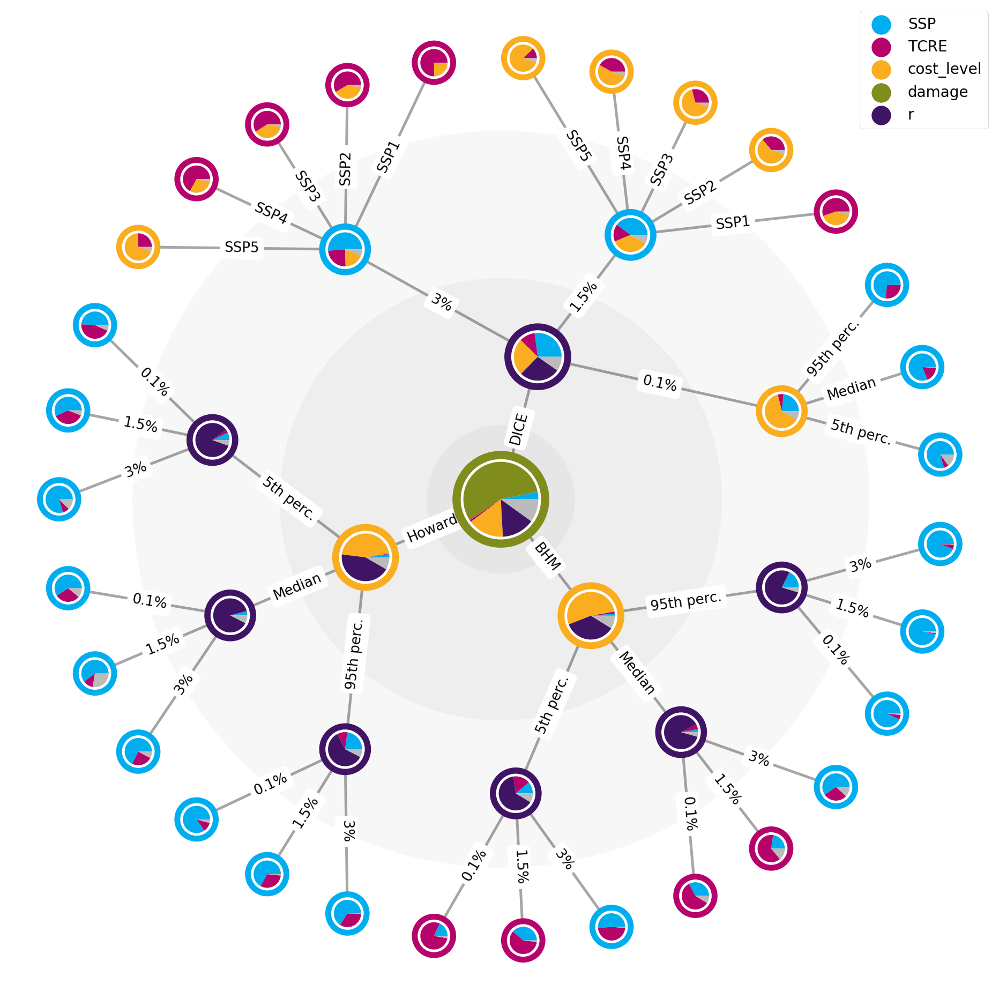

Wall time: 1min 22s


In [48]:
%%time
tree_CBA_temps_Sobol = TreeAnalysisSobol(
    temps.replace({'Howard Total': 'Howard', 'Burke (LR)': 'BHM'}),
    probs=cost_and_TCRE_probs_newname, N=1000000, colors=colors_PBL
)
tree_CBA_temps_Sobol.edge_width = 5
tree_CBA_temps_Sobol.edge_alpha = 0.35
tree_CBA_temps_Sobol.filename = 'tree_temps'
tree_CBA_temps_Sobol.create_tree()
tree_CBA_temps_Sobol.plot(max_depth=3, draw_labels=False) 

In [55]:
tree_CBA_temps_Sobol.tree['statistics']

{'value': 0.5609220050881699,
 'values': {'SSP': 0.03537935994763997,
  'damage': 0.5609220050881699,
  'TCRE': 0.007268035923200162,
  'cost_level': 0.15224360202014656,
  'r': 0.14610612985058383}}

In [ ]:
### CAREFUL: Different results when using [0.001, 0.01, 0.02] discount vs [0.001, 0.015, 0.03]

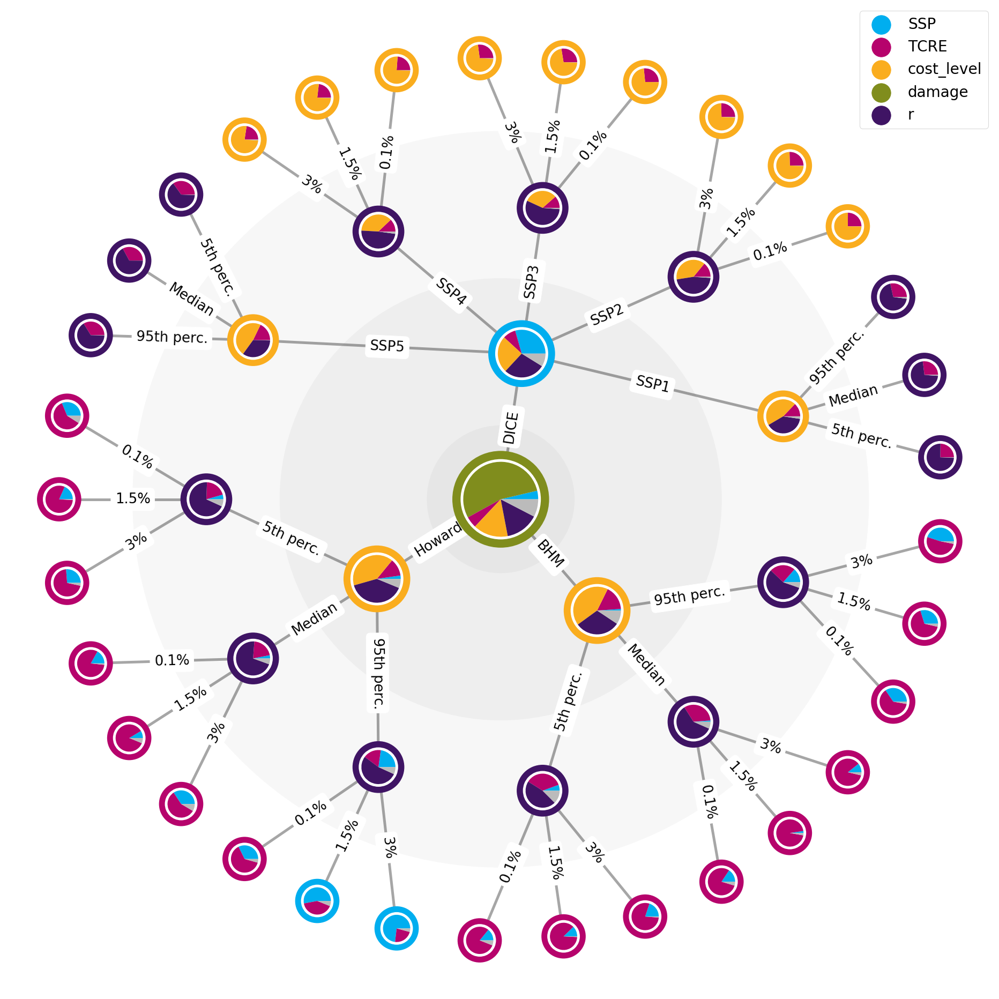

Wall time: 49.3 s


In [54]:
%%time
tree_CBA_CEs_Sobol = TreeAnalysisSobol(
    CEs.replace({'Howard Total': 'Howard', 'Burke (LR)': 'BHM'}),
    probs=cost_and_TCRE_probs_newname, N=500000, colors=colors_PBL
)
tree_CBA_CEs_Sobol.edge_width = 5
tree_CBA_CEs_Sobol.edge_alpha = 0.35
tree_CBA_CEs_Sobol.filename = 'tree_CEs'
tree_CBA_CEs_Sobol.create_tree()
tree_CBA_CEs_Sobol.plot(max_depth=3, draw_labels=False) 

#### Select criteria for having < 2C optimal warming

In [24]:
## TODO

In [56]:
from IPython.display import display_html
def display_side_by_side(*args):
    html_str=''
    for df in args:
        html_str+=df.to_html()
    display_html(html_str.replace('table','table style="display:inline; padding-left: 30px"'),raw=True)

In [57]:
n = len(temps[temps['temp'] <= 2.0])
display_side_by_side(
    temps[temps['temp'] <= 2.0].groupby('SSP').count()['temp'].to_frame('Share') / n,
    temps[temps['temp'] <= 2.0].groupby('damage').count()['temp'].to_frame('Share') / n,
    temps[temps['temp'] <= 2.0].groupby('TCRE').count()['temp'].to_frame('Share') / n,
    temps[temps['temp'] <= 2.0].groupby('cost_level').count()['temp'].to_frame('Share') / n,
    temps[temps['temp'] <= 2.0].groupby('r').count()['temp'].to_frame('Share') / n
)

,Share
SSP,
SSP1,0.220513
SSP2,0.200000
SSP3,0.189744
SSP4,0.210256
SSP5,0.179487
,Share
damage,
DICE,0.076923
Howard Total,0.317949


#### Show values per parameter

##### For each damage function

In [58]:
relative = True
fig1 = conditional_sobol(
    DiscreteSobol(temps.loc[:,:'r'], cost_and_TCRE_probs_newname),
    'damage', num=1000000, relative=relative
)
if not relative:
    fig1.update_xaxes(title='Variance in 2100 temperature')
fig1.show()

In [59]:
relative = False
fig2 = conditional_sobol(
    DiscreteSobol(CEs, cost_and_TCRE_probs_newname),
    'damage', num=100000, relative=relative
)
if not relative:
    fig2.update_xaxes(title='Variance in cumulative emissions')
fig2.show()

##### For each discount rate

In [736]:
relative = False
fig3 = conditional_sobol(
    DiscreteSobol(temps, cost_and_TCRE_probs_newname),
    'r', num=100000, relative=relative, param_name='Discount rate'
)
if not relative:
    fig3.update_xaxes(title='Variance in 2100 temperature')
fig3.show()

In [737]:
relative = False
fig4 = conditional_sobol(
    DiscreteSobol(CEs, cost_and_TCRE_probs_newname),
    'r', num=100000, relative=relative, param_name='Discount rate'
)
if not relative:
    fig4.update_xaxes(title='Variance in cumulative emissions')
fig4.show()

In [ ]:
# Hier boven misschien dempende werking van TCRE op temperatuur, omdat hoge TCRE, hoge temperatuur, dus meer reduceren, en andersom. Bij CE is het beter. 
# CE is beleidsrelevant. 

# Vraag is: wat moet het doel zijn, of is 2C optimaal?

In [ ]:
# Die bovenste is logischer, r is echt een keuze

In [175]:
repeated = np.concatenate([sobol_CBA_temps.sobol_indices(num=10000000) for _ in range(10)])

In [719]:
np.reshape(repeated, (-1,5)).mean(axis=0), np.reshape(repeated, (-1,5)).std(axis=0)

(array([0.16502464, 0.25530233, 0.06773567, 0.14294833, 0.25765105]),
 array([0.00070838, 0.00075952, 0.00055081, 0.00107364, 0.00136246]))

#### Cubic MAC and lower elasticity of marginal utility

In [64]:
temp_CBA_extra = df_all.loc[(df_all['year'] == 2100) & (df_all['beta'] == '2.0') & (df_all['elasmu'] == '1.45'),param_columns+['name', 'temp','abatementFraction']].set_index(['name'])

In [65]:
temp_CBA_extra['temp_elasmu1.001'] = df_indexed_all.loc[idx[:,:,:,:,:,'2.0','1.001', 2100,True],['name','temp']].reset_index(drop=True).set_index('name')
temp_CBA_extra['temp_beta3.0'] = df_indexed_all.loc[idx[:,:,:,:,:,'3.0','1.45', 2100,True],['name','temp']].reset_index(drop=True).set_index('name')

temp_CBA_extra['p_2030'] = df_indexed_all.loc[idx[:,:,:,:,:,'2.0','1.45', 2030,True],['name','p']].reset_index(drop=True).set_index('name')
temp_CBA_extra['p_2050'] = df_indexed_all.loc[idx[:,:,:,:,:,'2.0','1.45', 2050,True],['name','p']].reset_index(drop=True).set_index('name')
temp_CBA_extra['p_2070'] = df_indexed_all.loc[idx[:,:,:,:,:,'2.0','1.45', 2070,True],['name','p']].reset_index(drop=True).set_index('name')

temp_CBA_extra['p_2030_elasmu1.001'] = df_indexed_all.loc[idx[:,:,:,:,:,'2.0','1.001', 2030,True],['name','p']].reset_index(drop=True).set_index('name')
temp_CBA_extra['p_2050_elasmu1.001'] = df_indexed_all.loc[idx[:,:,:,:,:,'2.0','1.001', 2050,True],['name','p']].reset_index(drop=True).set_index('name')
temp_CBA_extra['p_2070_elasmu1.001'] = df_indexed_all.loc[idx[:,:,:,:,:,'2.0','1.001', 2070,True],['name','p']].reset_index(drop=True).set_index('name')

temp_CBA_extra['p_2030_beta3.0'] = df_indexed_all.loc[idx[:,:,:,:,:,'3.0','1.45', 2030,True],['name','p']].reset_index(drop=True).set_index('name')
temp_CBA_extra['p_2050_beta3.0'] = df_indexed_all.loc[idx[:,:,:,:,:,'3.0','1.45', 2050,True],['name','p']].reset_index(drop=True).set_index('name')
temp_CBA_extra['p_2070_beta3.0'] = df_indexed_all.loc[idx[:,:,:,:,:,'3.0','1.45', 2070,True],['name','p']].reset_index(drop=True).set_index('name')
temp_CBA_extra['abatementFraction_2030'] = df_indexed_all.loc[idx[:,:,:,:,:,'2.0','1.45', 2030,True],['name','abatementFraction']].reset_index(drop=True).set_index('name')
temp_CBA_extra['abatementFraction_2050'] = df_indexed_all.loc[idx[:,:,:,:,:,'2.0','1.45', 2050,True],['name','abatementFraction']].reset_index(drop=True).set_index('name')
temp_CBA_extra['abatementFraction_2070'] = df_indexed_all.loc[idx[:,:,:,:,:,'2.0','1.45', 2070,True],['name','abatementFraction']].reset_index(drop=True).set_index('name')

temp_CBA_extra['abatementFraction_2030_beta3.0'] = df_indexed_all.loc[idx[:,:,:,:,:,'3.0','1.45', 2030,True],['name','abatementFraction']].reset_index(drop=True).set_index('name')
temp_CBA_extra['abatementFraction_2050_beta3.0'] = df_indexed_all.loc[idx[:,:,:,:,:,'3.0','1.45', 2050,True],['name','abatementFraction']].reset_index(drop=True).set_index('name')
temp_CBA_extra['abatementFraction_2070_beta3.0'] = df_indexed_all.loc[idx[:,:,:,:,:,'3.0','1.45', 2070,True],['name','abatementFraction']].reset_index(drop=True).set_index('name')

temp_CBA_extra.head()

,SSP,damage,TCRE,cost_level,r,temp,abatementFraction,temp_elasmu1.001,temp_beta3.0,p_2030,...,p_2070_elasmu1.001,p_2030_beta3.0,p_2050_beta3.0,p_2070_beta3.0,abatementFraction_2030,abatementFraction_2050,abatementFraction_2070,abatementFraction_2030_beta3.0,abatementFraction_2050_beta3.0,abatementFraction_2070_beta3.0
name,,,,,,,,,,,,,,,,,,,,,
CBA SSP1 damageBurkeWithLag 0.00042 p05 0.001,SSP1,Burke (LR),0.42,5th perc.,0.1%,1.177819,0.006945,1.133495,1.230706,208.228873,...,372.499723,234.462758,392.796648,500.339917,0.012423,0.014676,0.012881,0.010997,0.012785,0.011914
CBA SSP1 damageBurkeWithLag 0.00042 p05 0.015,SSP1,Burke (LR),0.42,5th perc.,1.5%,1.289956,0.006870,1.234651,1.348778,149.533278,...,348.398424,152.625943,286.999655,397.744488,0.007371,0.010705,0.010799,0.006118,0.008307,0.008675
CBA SSP1 damageBurkeWithLag 0.00042 p05 0.03,SSP1,Burke (LR),0.42,5th perc.,3%,1.406176,0.006100,1.351311,1.453310,107.459527,...,308.135286,102.062344,214.115744,313.925698,0.004384,0.007564,0.008548,0.003533,0.005555,0.006261
CBA SSP1 damageBurkeWithLag 0.00042 p50 0.001,SSP1,Burke (LR),0.42,Median,0.1%,1.358010,0.015303,1.276287,1.400172,351.695072,...,805.799375,362.376264,638.356351,861.889997,0.016569,0.022228,0.022610,0.014155,0.017587,0.017722
CBA SSP1 damageBurkeWithLag 0.00042 p50 0.015,SSP1,Burke (LR),0.42,Median,1.5%,1.533011,0.011694,1.457133,1.546565,215.385883,...,641.446666,202.732517,407.053578,596.759550,0.007669,0.012765,0.014833,0.006409,0.009488,0.010685


In [75]:
fig = make_subplots(1, 3, subplot_titles=(2030, 2050, 2070))

minvals = [2000,2000,2000]

for i, year in enumerate(['2030', '2050', '2070']):
    
    xvals = np.linspace(0,minvals[i], 50)
    fig.append_trace(go.Scatter(x=xvals, y=xvals, name='x=y line', showlegend=i==0, line_color='#BBB'), 1, i+1)
    
    for trace in px.scatter(temp_CBA_extra, x='p_'+year, y='p_'+year+'_elasmu1.001', color='SSP').data:
        trace.showlegend = i==0
        fig.append_trace(trace, 1, i+1)

fig.update_layout(
    width=950, height=400,
    margin={'t': 50, 'b': 20, 'l': 20, 'r': 20},
    legend_y=0.5,
    xaxis_range=[0,minvals[0]], yaxis_range=[0,minvals[0]],
    xaxis2_range=[0,minvals[1]], yaxis2_range=[0,minvals[1]],
    xaxis3_range=[0,minvals[2]], yaxis3_range=[0,minvals[2]]
)
fig.update_xaxes(title='C-price, elasmu=1.45')
fig.update_yaxes(title='C-price, elasmu=1.001', col=1)

fig.show()

# pio.write_image(fig, '../Paper/img/cprice_CBA_diff_elasmu.png', scale=2)

In [76]:
fig = make_subplots(1, 3, subplot_titles=(2030, 2050, 2070))

minvals = [2000,2000,2000]

for i, year in enumerate(['2030', '2050', '2070']):
    
    xvals = np.linspace(0,minvals[i], 50)
    fig.append_trace(go.Scatter(x=xvals, y=xvals, name='x=y line', showlegend=i==0, line_color='#BBB'), 1, i+1)
    
    for trace in px.scatter(temp_CBA_extra, x='p_'+year, y='p_'+year+'_beta3.0', color='cost_level').data:
        trace.showlegend = i==0
        fig.append_trace(trace, 1, i+1)

fig.update_layout(
    width=950, height=400,
    margin={'t': 50, 'b': 20, 'l': 20, 'r': 20},
    legend_y=0.5,
    xaxis_range=[0,minvals[0]], yaxis_range=[0,minvals[0]],
    xaxis2_range=[0,minvals[1]], yaxis2_range=[0,minvals[1]],
    xaxis3_range=[0,minvals[2]], yaxis3_range=[0,minvals[2]]
)
fig.update_xaxes(title='C-price, quadratic MAC')
fig.update_yaxes(title='C-price, cubic MAC', col=1)

fig.show()

# pio.write_image(fig, '../Paper/img/cprice_CBA_diff_beta.png', scale=2)

In [69]:
fig = make_subplots(1, 3, subplot_titles=(2030, 2050, 2070))

minvals = [0.1,0.1,0.1]

for i, year in enumerate(['2030', '2050', '2070']):
    
    xvals = np.linspace(0,minvals[i], 50)
    fig.append_trace(go.Scatter(x=xvals, y=xvals, name='x=y line', showlegend=i==0, line_color='#BBB'), 1, i+1)
    
    for trace in px.scatter(temp_CBA_extra, x='abatementFraction_'+year, y='abatementFraction_'+year+'_beta3.0', color='cost_level').data:
        trace.showlegend = i==0
        fig.append_trace(trace, 1, i+1)

fig.update_layout(
    width=950, height=400,
    margin={'t': 50, 'b': 20, 'l': 20, 'r': 20},
    legend_y=0.5,
    xaxis_range=[0,minvals[0]], yaxis_range=[0,minvals[0]],
    xaxis2_range=[0,minvals[1]], yaxis2_range=[0,minvals[1]],
    xaxis3_range=[0,minvals[2]], yaxis3_range=[0,minvals[2]]
)
fig.update_xaxes(title='Abatement fraction, quadratic MAC')
fig.update_yaxes(title='Abatement fraction, cubic MAC', col=1)

fig.show()

#pio.write_image(fig, '../Paper/img/abatementfrac_CBA_diff_beta.png', scale=2)

In [77]:
fig = px.scatter(temp_CBA_extra, x='temp', y='temp_beta3.0', color='cost_level')
xtmp = np.linspace(1,5.16,100)
fig.append_trace(go.Scatter(x=xtmp, y=xtmp, name='x=y line', line_color='#AAA'), 1, 1)
fig.update_xaxes(title='Optimal temperature 2100, quadratic MAC', ticksuffix=' °C')
fig.update_yaxes(title='Optimal temperature 2100, cubic MAC', ticksuffix=' °C')
fig.update_layout(width=950, height=500, legend_y=0.5, margin={'t': 20, 'b': 20})
fig.show()

# pio.write_image(fig, '../Paper/img/temp_CBA_diff_beta.png', scale=2)

In [78]:
fig = px.scatter(temp_CBA_extra, x='temp', y='temp_elasmu1.001', color='SSP')
xtmp = np.linspace(1,5.16,100)
fig.append_trace(go.Scatter(x=xtmp, y=xtmp, name='x=y line', line_color='#AAA'), 1, 1)
fig.update_xaxes(title='Optimal temperature 2100, elasmu=1.45', ticksuffix=' °C')
fig.update_yaxes(title='Optimal temperature 2100, elasmu=1.001', ticksuffix=' °C')
fig.update_layout(width=950, height=500, legend_y=0.5, margin={'t': 20, 'b': 20})
fig.show()

# pio.write_image(fig, '../Paper/img/temp_CBA_diff_elasmu.png', scale=2)

#### Inertia

In [63]:
with_or_without_CBA = pd.merge(
    df, df_inertia, on=['name','year'], suffixes=('','_inertia')
)

In [64]:
(with_or_without_CBA.loc[with_or_without_CBA['year'] == 2100, 'temp_inertia'] - with_or_without_CBA.loc[with_or_without_CBA['year'] == 2100, 'temp']).describe(percentiles=[0.05,0.95])

count    405.000000
mean       0.010314
std        0.014410
min       -0.003327
5%        -0.000272
50%        0.005621
95%        0.038087
max        0.115324
dtype: float64

In [181]:
(with_or_without_CBA['temp_inertia'] - with_or_without_CBA['temp']).describe(percentiles=[0.05,0.95])

count    14985.000000
mean         0.009269
std          0.017877
min         -0.015718
5%          -0.000938
50%          0.003006
95%          0.042474
max          0.218895
dtype: float64

In [66]:

with_or_without_CBA['diff_E'] = with_or_without_CBA['E'] - with_or_without_CBA['E_inertia']
px.line(
    with_or_without_CBA,line_group='name',
    x='year', y='diff_E', facet_col='SSP', facet_row='damage', color='r', render_mode='svg'
)

#### Carbon price Sobol decomposition

In [76]:
param_columns = ['SSP', 'damage', 'TCRE', 'cost_level', 'r']

In [77]:
%%time

relative = True

selection = df.loc[df['damage'].isin(['DICE', 'Howard Total', 'Burke (LR)']) & df['TCRE'].isin(['0.42','0.62','0.82'])]

years = np.arange(2030, 2101, 5)
sobol_CBA_per_year = {
    year: conditional_sobol(DiscreteSobol(
            selection.loc[(df['year'] == year), ['p'] + param_columns],
            cost_and_TCRE_probs
        ), 'damage', num=600000, plot=False, relative=relative)
    for year in tqdm(years)
}

100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [01:05<00:00,  4.36s/it]

Wall time: 1min 5s


In [78]:
fig = make_subplots(
    2,3,
    subplot_titles=('All damage functions', 'Damage: Burke (LR)', 'Damage: Howard Total', 'Damage: DICE'),
    row_heights=[0.4, 0.6],
    vertical_spacing=0.15,
    specs=[[{"colspan": 3},None,None],
           [{},{},{}]]
)

use_sqrt = False

max_vals = {}

mean_p = df.loc[(df['elasmu']=='1.45') & (df['beta']=='2.0'), ['name', 'year', 'p']].set_index(['name', 'year']).unstack('year').mean()

for i, key in enumerate(sobol_CBA_per_year[list(sobol_CBA_per_year.keys())[0]].keys()):
    matrix = np.array([x[key] for x in sobol_CBA_per_year.values()]).T
    y_title = 'Contribution to variance'
    if not relative:
        if use_sqrt:
            matrix = np.sqrt(np.maximum(0.0, matrix))# / np.interp(years, mean_p['p'].index, mean_p['p'].values)
            y_title = 'Standard deviation (US$)'
        else:
            y_title = 'Variance'
    row_num = 1 if i == 0 else 2
    col_num = 1 if i == 0 else i
    max_vals[i] = 1.05 * matrix.sum(axis=0).max()
    for col, row, color in zip(param_columns+['Interactions'], matrix, colors_PBL):#px.colors.DEFAULT_PLOTLY_COLORS):
        if col == 'Interactions':
            color = '#CCC'
        fig.add_trace(go.Scatter(
            x=years, y=row,
            mode='lines', stackgroup=key[0],
            line={'color': color, 'width': 0}, fillcolor=color,
            name=col, legendgroup=col,
            showlegend=i == 0
        ), row_num, col_num)

to_percentage = {'range': [0,1], 'tickformat': ',.0%'}

if not relative and use_sqrt:
    max_vals[1] = 400
    max_vals[2] = 1000

if not relative:
    for i in range(2,4):
        fig.add_shape(go.layout.Shape(
            type='line', xref='paper', yref='paper', layer='below', line_color='#E5ECF6', line_width=2.5,
            x0=fig.layout['xaxis'+str(i)].domain[1], y0=fig.layout['yaxis'+str(i)].domain[1],
            x1=fig.layout['xaxis'+str(i+1)].domain[0], y1=fig.layout['yaxis'+str(i+1)].domain[1] * max_vals[i-1] / max_vals[i]))
        fig.add_shape(go.layout.Shape(
            type='line', xref='paper', yref='paper', layer='below', line_color='#E5ECF6', line_width=2.5,
            x0=fig.layout['xaxis'+str(i)].domain[1], y0=0, x1=fig.layout['xaxis'+str(i+1)].domain[1], y1=0
        ))
        
fig.update_layout(
    yaxis1={**(to_percentage if relative else {}), 'title': y_title},
    yaxis2={**(to_percentage if relative else {'range': [0, max_vals[1]]}), 'title': y_title},
    yaxis3={**(to_percentage if relative else {'range': [0, max_vals[2]]})},
    yaxis4={**(to_percentage if relative else {'range': [0, max_vals[3]]})},
    margin={'l': 0, 't': 50, 'b': 30},
    legend={'traceorder': 'reversed', 'y': 0.5, 'font_size': 14},
    width=950,
    height=550
)
fig.show()
    

In [79]:
pio.write_image(fig, '../Paper/img/cprice_CBA_var_decomp.png', scale=2)

#### Discrete approximation of normal distribution

In [16]:
def sample_discrete(n, p0):
    p1 = (1-p0)/2
    TCRE_values = np.array([0.62-0.12*1.64485, 0.62, 0.62+0.12*1.64485])
    print(p1+p0+p1, p0/p1)
    return np.random.choice(TCRE_values, size=n, p=np.array([p1, p0, p1]))

In [13]:
1 - 2*1/(2*(1.64485)**2)

0.6303868605175345

In [24]:
np.array([0.62-0.12*1.64485, 0.62, 0.62+0.12*1.64485])

array([0.422618, 0.62    , 0.817382])

In [17]:
%%time
np.std(sample_discrete(2000000, 0.63038686))

1.0 3.411063037423399
Wall time: 90 ms


0.11998121652965889

In [15]:
0.62 - 0.38

0.24

In [20]:
0.62-2*0.12

0.38

In [23]:
scipy.stats.norm(loc=0.62, scale=0.12).ppf(0.975)

0.8551956781448065

In [130]:
def sample_discrete2(n, p0):
    p1 = (1-p0)/2
    vmin = scipy.stats.norm(loc=0, scale=1).ppf(0.16)
    vmax = scipy.stats.norm(loc=0, scale=1).ppf(0.84)
    values = np.array([vmin, 0, vmax])
    print(p1+p0+p1, p0/p1)
    return np.random.choice(values, size=n, p=np.array([p1, p0, p1]))

In [101]:
import scipy.stats

In [122]:
scipy.stats.norm(loc=0, scale=1).ppf(0.8413445)

0.9999989830653345

In [133]:
np.std(sample_discrete2(2000000, 0.0))

1.0 0.0


0.9944576275897906

## Determine minimum discount rate

In [61]:
import carbontaxdamages.economics

In [97]:
t_values_years = np.linspace(2015, 2200, 100)

In [98]:


go.Figure([
    go.Scatter(x=t_values_years, y=growth_rate_GDP_per_capita(SSP)[1], name=SSP)
    for SSP in ['SSP1', 'SSP2', 'SSP3', 'SSP4', 'SSP5']
])

In [99]:
def annual_growth_rate(data, years):
    dt = years[-1] - years[0]
    rate = (data[-1] / data[0]) ** (1/dt) - 1
    
    yearly_rates = (data[1:] - data[:-1]) / data[:-1]
    
    return rate, yearly_rates

In [88]:
def growth_rate_GDP_per_capita(SSP):
    GDP_per_capita = (
        carbontaxdamages.economics.GDP(t_values_years, SSP) 
        / carbontaxdamages.economics.population(t_values_years, SSP)
    )
    
    return annual_growth_rate(GDP_per_capita, t_values_years), GDP_per_capita

In [109]:
np.ones_like(test)

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [104]:
test = [1]
for rate in growth_rate_GDP_per_capita('SSP4')[0][1]:
    test.append(test[-1] * (1+rate))

In [108]:
go.Figure([
    go.Scatter(y=test),
    go.Scatter(y=growth_rate_GDP_per_capita('SSP4')[1] / growth_rate_GDP_per_capita('SSP4')[1][0])
])

In [100]:
{SSP: growth_rate_GDP_per_capita(SSP) for SSP in ['SSP1', 'SSP2', 'SSP3', 'SSP4', 'SSP5']}

{'SSP1': ((0.01306291767128731,
   array([0.0554049 , 0.0507832 , 0.06083793, 0.08316181, 0.07498668,
          0.06814815, 0.06234653, 0.05736538, 0.07221891, 0.06683736,
          0.06172169, 0.05727854, 0.05338444, 0.05303508, 0.05175492,
          0.04889998, 0.04632918, 0.04400225, 0.04244023, 0.04210137,
          0.04046842, 0.03895991, 0.03756214, 0.03626336, 0.03734243,
          0.03649293, 0.03551125, 0.03459001, 0.03372393, 0.03297181,
          0.03240539, 0.03186609, 0.03135574, 0.03087243, 0.03048925,
          0.03042683, 0.03017669, 0.029943  , 0.02972512, 0.02952241,
          0.02867817, 0.02855478, 0.02855657, 0.02856983, 0.02859462,
          0.02863098, 0.02867901, 0.02873882, 0.02881056, 0.02889441,
          0.02803564, 0.02320028, 0.02327571, 0.02335777, 0.02344661,
          0.02354236, 0.01879887, 0.01773646, 0.01780029, 0.01786727,
          0.01793747, 0.01522675, 0.0120059 , 0.01204063, 0.01207639,
          0.01211318, 0.01148948, 0.00607056, 0.00608036, 

In [95]:
{SSP: '{:.3f}'.format(growth_rate_GDP_per_capita(SSP)[0]) for SSP in ['SSP1', 'SSP2', 'SSP3', 'SSP4', 'SSP5']}

{'SSP1': '0.023',
 'SSP2': '0.019',
 'SSP3': '0.008',
 'SSP4': '0.014',
 'SSP5': '0.029'}

1.5 + 2 * per capita groei

In [72]:
(GDP_per_capita[-1] / GDP_per_capita[0])**(1/(t_values_years[-1] - t_values_years[0])) - 1

0.029221237747162343

# Runs

In [34]:
from carbontaxdamages.defaultparams import Params
from carbontaxdamages.run import full_run_structured, export_output

In [30]:
output = full_run_structured(Params(
    T = 85+20,
    t_values_num = int(105/5)+1,
    damage='nodamage',
    K_values_num=20, CE_values_num=1500, p_values_num=800,
    cost_level='p50', SSP='SSP3', carbonbudget=1450, elasmu=1.45,
    TCRE=0.00086,
    maximise_utility=True, r=0.015,
    useCalibratedGamma=True,
    runname="Experiment test %SSP 2120 %damage TCRE %TCRE cost %cost_level r=%r %minEmissions budget 2C utility %maximise_utility elasmu %elasmu",
    shortname="%SSP %damage %TCRE %cost_level %r"
))
export_output(output, plot=True, inline=True)

100%|██████████████████████████████████████████████████████████████████████████████████| 22/22 [00:43<00:00,  1.97s/it]


1449.3908403130613 0.19681572137995498


In [32]:
output = full_run_structured(Params(
    T = 80,
    t_values_num = int(80/5)+1,
    damage='nodamage',
    K_values_num=20, CE_values_num=1500, p_values_num=800,
    cost_level='p50', SSP='SSP3', carbonbudget=0, carbonbudgetOld=1450, elasmu=1.45,
    TCRE=0.00086,
    maximise_utility=True, r=0.015,
    useCalibratedGamma=True,
    runname="Experiment test %SSP 2120 %damage TCRE %TCRE cost %cost_level r=%r %minEmissions budget 2C utility %maximise_utility elasmu %elasmu",
    shortname="%SSP %damage %TCRE %cost_level %r"
))
export_output(output, plot=True, inline=True)

100%|██████████████████████████████████████████████████████████████████████████████████| 17/17 [00:32<00:00,  1.90s/it]


1447.0801401803005 0.2748288573568364


In [491]:
0.86 * 1300 / 1000 + 0.9

2.0180000000000002

In [549]:
output = full_run_structured(Params(
    T = 95,
    t_values_num = int(95/5)+1,
    damage='damageHowardTotal',
    K_values_num=15, CE_values_num=1000, p_values_num=800,
    cost_level='p50', SSP='SSP2', carbonbudget=1450, elasmu=1.45,
    TCRE=0.00062,
    maximise_utility=True, r=0.015,
    useCalibratedGamma=True,
    runname="Experiment test %SSP 2120 %damage TCRE %TCRE cost %cost_level r=%r %minEmissions budget 2C utility %maximise_utility elasmu %elasmu",
    shortname="%SSP %damage %TCRE %cost_level %r"
))
export_output(output, plot=True, inline=True)

100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [00:25<00:00,  1.27s/it]


1448.9584102521544 0.23690691428361835


In [567]:
go.Figure([
    go.Scatter(y=output['damageFraction']),
    go.Scatter(y=(-output['investments'] - output['consumption'] + output['Y']) / output['Ygross']),
])

# Model parameter figures

In [37]:
from carbontaxdamages.economics import *

In [30]:
colors_SSPs = {
    'SSP1': colors_PBL[3],
    'SSP2': colors_PBL[1],
    'SSP3': colors_PBL[4],
    'SSP4': colors_PBL[2],
    'SSP5': colors_PBL[5]
}

In [31]:
extended = False
years = np.linspace(2020, 2200 if extended else 2100, 100)
SSPs = ['SSP1', 'SSP2', 'SSP3', 'SSP4', 'SSP5']

fig = make_subplots(1,3, subplot_titles=('Emissions', 'GDP per capita', 'Population'), horizontal_spacing=0.08)
for SSP in SSPs:
    color = colors_SSPs[SSP]
    fig.append_trace(go.Scatter(x=years, y=baseline_emissions(years, SSP), line_color=color, name=SSP, legendgroup=SSP), 1, 1)
    fig.append_trace(go.Scatter(x=years, y=GDP(years, SSP) * 1e12 / population(years, SSP), line_color=color, showlegend=False, legendgroup=SSP), 1, 2)
    fig.append_trace(go.Scatter(x=years, y=population(years, SSP), line_color=color, showlegend=False, legendgroup=SSP), 1, 3)
fig.update_layout(
    legend_y=0.5, width=950, height=350, margin={'l': 20, 'r': 30, 'b': 30, 't': 30},
    yaxis1={'title': 'GtCO<sub>2</sub>/yr', 'range': [0, 117.29], 'title_standoff': 0},
    yaxis2={'title': 'US$/yr', 'title_standoff': 0, 'rangemode': 'tozero'},
    yaxis3={'range': [0, 1.496e+10 if extended else 13e9]}
)
fig.show()

In [216]:
pio.write_image(fig, '../Paper/img/SSP_baselines.png', scale=2)

In [32]:
@nb.njit([ f8(f8), f8_1d(f8_1d) ], fastmath=True)
def damageBurkePooledSR(T):
    shift = 0.8
    return 0.0 * T + (T > 0.8) * ( 0.13204546 * (T-shift) - 0.01882913 * (T-shift)**2 )

In [33]:
Ts = np.linspace(0, 5, 100)
damage = [(damageDICE, 'DICE'), (damageNewboldMartin2014, 'Newbold Marten 2014'), (damageHowardTotal, 'Howard Total'), (damageBurkePooledSR, 'Burke Pooled SR'), (damageBurkePooled, 'Burke Pooled')][::-1]
fig = make_subplots(1,1, subplot_titles=('Damage (% GDP loss)',))
for (damage, name), color in zip(damage, colors_PBL[:]):
    fig.append_trace(go.Scatter(x=Ts, y=damage(Ts), line_color=color, line_width=3, name=name), 1, 1)
fig.update_layout(legend_y=0.5, font_size=18, width=750, yaxis_tickformat=',.0%', xaxis_ticksuffix=' °C')
fig.show()

NameError: name 'damageBurkePooled' is not defined

In [34]:
Ts = np.linspace(0.8, 5, 100)
fig = go.Figure(go.Scatter(x=Ts, y=damageNewboldMartin2014(Ts) / damageDICE(Ts), name='Newbold&Marten <br>divided by<br>DICE'))
fig.add_trace(go.Scatter(x=Ts, y=damageHowardTotal(Ts) / damageDICE(Ts), name='Howard Total <br>divided by<br>DICE'))
fig.add_trace(go.Scatter(x=Ts, y=np.ones_like(Ts), name='If equal'))
fig.update_layout(legend_y=0.5, font_size=14, width=750, yaxis_tickformat=',.0%', xaxis_ticksuffix=' °C', yaxis_rangemode='tozero')
fig.show()

In [540]:
pio.write_image(fig, '../Paper/img/damage_functions.png', scale=2)

In [457]:
str(damageDICE)

'CPUDispatcher(<function damageDICE at 0x000001AE63E9E8B8>)'

### Burke damage function

In [35]:
from scipy.optimize import curve_fit

In [36]:
def f(x, a, b):
    return a*(x-0.8) + b*(x-0.8)**2

In [37]:
data_pooled_LR = np.array([[0.8059071729957806, -0.001356293001862574],[1.0590717299578059, -0.08627969741893798],[1.3924050632911393, -0.19278620392544438],[1.7130801687763713, -0.28056005372461074],[2.0464135021097043, -0.3654449386094955],[2.312236286919831, -0.42009199072490194],[2.632911392405063, -0.48480277746100514],[2.962025316455696, -0.5437437437437433],[3.5485232067510544, -0.6285069880006586],[4.0886075949367084, -0.6959952357420711],[4.518987341772151, -0.7404731313592072],[4.8691983122362865, -0.7705751320941192],[5.10970464135021, -0.7891983122362867]])
data_diff_LR = np.array([[0.7974683544303797, -0.001360347689461583],[1.2236286919831223, -0.07755198236210897],[1.662447257383966, -0.14941321067903351],[2.0632911392405062, -0.20976115355862185],[2.4936708860759493, -0.27297778791449673],[2.9915611814345993, -0.3390448676524625],[3.3924050632911387, -0.38497839611763646],[3.843881856540084, -0.4366533622229822],[4.320675105485232, -0.48543328138264824],[4.763713080168776, -0.5241393292026202],[5.11392405063291, -0.5556827713789738]])
data_pooled_SR = np.array([[0.7972544878563887, 0],[1.282998944033791, -0.0691891891891892],[1.6335797254487858, -0.10810810810810817],[2.0052798310454065, -0.1412612612612612],[2.4276663146779303, -0.17009009009009007],[2.8458289334741287, -0.19027027027027027],[3.2639915522703276, -0.20468468468468465],[3.6610348468849, -0.21621621621621617],[4.041182682154172, -0.22198198198198188],[4.404435058078143, -0.22630630630630627],[4.767687434002113, -0.2277477477477478],[5.156282998944034, -0.22918918918918912]])

In [38]:
popt, pcov = curve_fit(f, data_pooled_LR[:,0], data_pooled_LR[:,1], [-1,1])

popt_diff, pcov_diff = curve_fit(f, data_diff_LR[:,0], data_diff_LR[:,1], [-1,1])

popt_sr, pcov_sr = curve_fit(f, data_pooled_SR[:,0], data_pooled_SR[:,1], [-1,1])

In [39]:
popt_sr

array([-0.13204546,  0.01882913])

In [40]:
x_values = np.linspace(0.8, 5.5, 100)

go.Figure([
    go.Scatter(x=data_pooled_LR[:,0], y=data_pooled_LR[:,1]),
    go.Scatter(x=data_diff_LR[:,0], y=data_diff_LR[:,1]),
    go.Scatter(x=data_pooled_SR[:,0], y=data_pooled_SR[:,1]),
    go.Scatter(x=x_values, y=f(x_values, *popt)),
    go.Scatter(x=x_values, y=f(x_values, *popt_diff)),
    go.Scatter(x=x_values, y=f(x_values, *popt_sr)),
    go.Scatter(x=x_values, y=-damageHowardTotal(x_values), name='Howard')
])

In [463]:
popt, popt_diff

(array([-0.32665691,  0.03393201]), array([-0.18144881,  0.01233623]))